In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

### 1. Ler base tratada

In [2]:
# read pickle file
df_enem = pd.read_pickle('Bases\MICRODADOS_ENEM_2023_tratados.pkl')

In [3]:
df_enem.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 716570 entries, 0 to 716569
Data columns (total 45 columns):
 #   Column                   Non-Null Count   Dtype   
---  ------                   --------------   -----   
 0   BIN_Q001_DUMMY_H         716570 non-null  bool    
 1   BIN_Q002_DUMMY_H         716570 non-null  bool    
 2   BIN_Q018                 716570 non-null  bool    
 3   BIN_Q020                 716570 non-null  bool    
 4   BIN_Q021                 716570 non-null  bool    
 5   BIN_Q023                 716570 non-null  bool    
 6   BIN_Q025                 716570 non-null  bool    
 7   CAT_COR_RACA             716570 non-null  category
 8   CAT_CO_MUNICIPIO_ESC     716570 non-null  category
 9   CAT_CO_UF_ESC            716570 non-null  category
 10  CAT_DEPENDENCIA_ADM_ESC  716570 non-null  category
 11  CAT_ENSINO               716570 non-null  category
 12  CAT_ESCOLA               716570 non-null  category
 13  CAT_ESTADO_CIVIL         716570 non-null  ca

In [4]:
# Separarar variáveis por tipo
df_enem_num = df_enem.select_dtypes(include=['int64', 'float64'])
df_enem_bin = df_enem.select_dtypes(include=['bool'])
df_enem_cat = df_enem.select_dtypes(include=['category'])

In [5]:
print(len(df_enem_num.columns.to_list()))
print(len(df_enem_bin.columns.to_list()))
print(len(df_enem_cat.columns.to_list()))

23
7
15


### 2. Analise variáveis numéricas

In [6]:
df_enem_num.describe()

,NUM_NOTA_CH,NUM_NOTA_CN,NUM_NOTA_LC,NUM_NOTA_MT,NUM_NOTA_REDACAO,NUM_Q001,NUM_Q002,NUM_Q005,NUM_Q006,NUM_Q007,...,NUM_Q011,NUM_Q012,NUM_Q013,NUM_Q014,NUM_Q015,NUM_Q016,NUM_Q017,NUM_Q019,NUM_Q022,NUM_Q024
count,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,...,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000,716570.000000
mean,527.936323,500.733294,522.585430,550.160000,644.812370,3.559742,3.930922,3.843407,4.420778,0.199027,...,0.293357,1.073091,0.594168,0.730091,0.167234,0.589560,0.051466,1.553231,3.021931,0.872687
std,84.612620,80.108870,73.721655,127.349918,215.503688,1.489756,1.427894,1.239664,4.000782,0.638207,...,0.543278,0.347067,0.631314,0.487184,0.381682,0.520253,0.227886,1.067964,1.446643,1.081564
min,293.500000,320.300000,287.000000,322.100000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,472.800000,442.500000,476.300000,443.300000,520.000000,3.000000,3.000000,3.000000,1.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000,0.000000
50%,535.200000,497.800000,528.600000,543.400000,660.000000,4.000000,4.000000,4.000000,3.000000,0.000000,...,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,3.000000,1.000000
75%,588.800000,555.400000,574.800000,648.400000,820.000000,4.000000,5.000000,4.000000,6.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2.000000,5.000000,1.000000
max,823.000000,868.400000,820.800000,958.600000,1000.000000,6.000000,6.000000,20.000000,16.000000,3.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


    1. Observar assimetrias, outliers, normalidade

- 'Q008', # Quantidade de banheiro (código A a E)
- 'Q009', # Quantidade de quartos (código A a E)
- 'Q010', # Quantidade de carros (código A a E)
- 'Q011', # Quantidade de motos (código A a E)
- 'Q012', # Quantidade de geladeira (código A a E)
- 'Q013', # Quantidade de freezer (código A a E)
- 'Q014', # Quantidade de máquina de lavar roupa (código A a E)
- 'Q015', # Quantidade de máquina de secar roupa (código A a E)
- 'Q016', # Quantidade de microondas (código A a E)
- 'Q017', # Quantidade de máquina de lavar louça (código A a E)
- 'Q019', # Quantidade de televisores (código A a E)
- 'Q022', # Quantidade de celulares (código A a E)
- 'Q024', # Quantidade de computadores (código A a E)

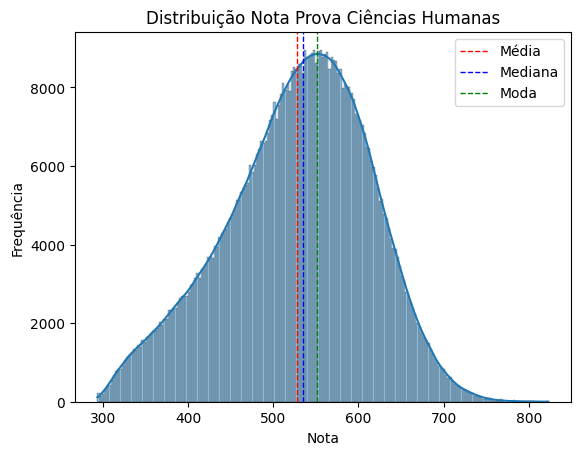

In [7]:
for col in ['NUM_NOTA_CH']:
    sns.histplot(df_enem[col], kde=True)
    plt.title(f'Distribuição Nota Prova Ciências Humanas')
    plt.xlabel('Nota')
    plt.ylabel('Frequência')
    plt.axvline(df_enem[col].mean(), color='red', linestyle='dashed', linewidth=1, label='Média')
    plt.axvline(df_enem[col].median(), color='blue', linestyle='dashed', linewidth=1, label='Mediana')
    plt.axvline(df_enem[col].mode()[0], color='green', linestyle='dashed', linewidth=1, label='Moda')
    plt.legend()
    plt.show()

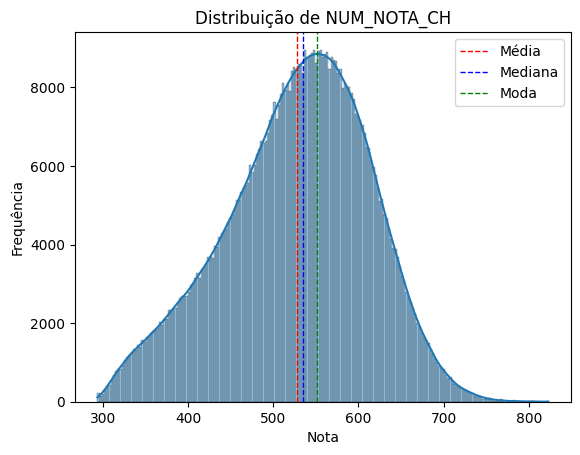

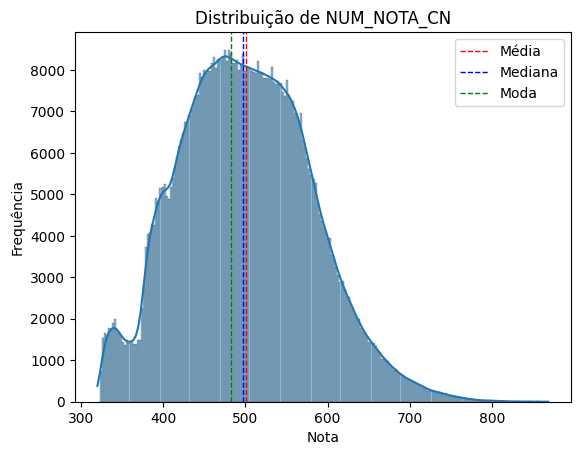

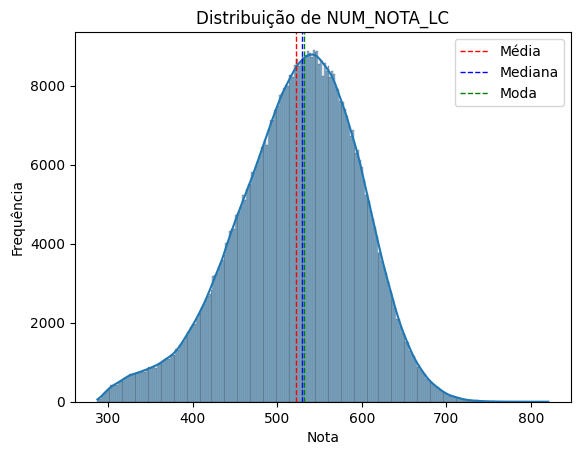

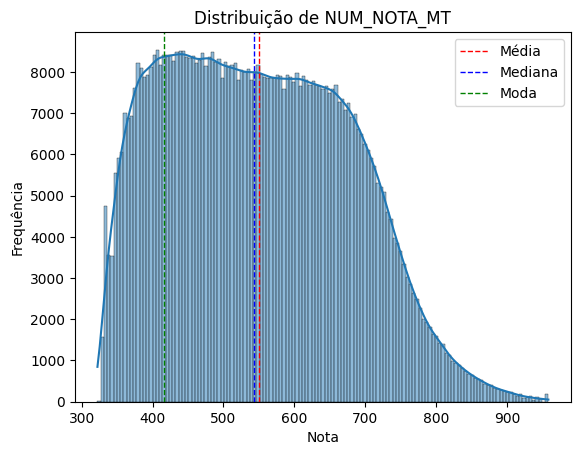

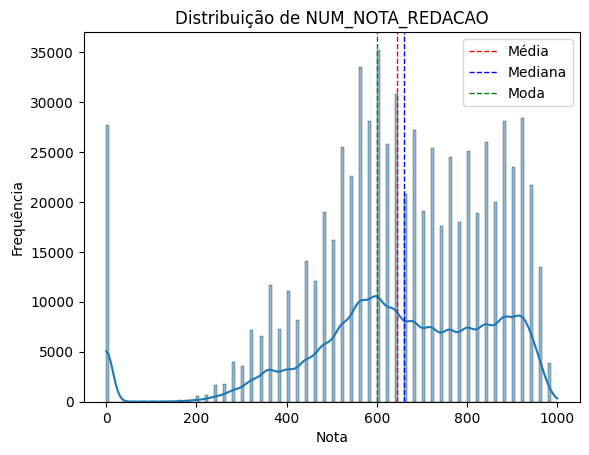

In [8]:
for col in ['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']:
    sns.histplot(df_enem[col], kde=True)
    plt.title(f'Distribuição de {col}')
    plt.xlabel('Nota')
    plt.ylabel('Frequência')
    plt.axvline(df_enem[col].mean(), color='red', linestyle='dashed', linewidth=1, label='Média')
    plt.axvline(df_enem[col].median(), color='blue', linestyle='dashed', linewidth=1, label='Mediana')
    plt.axvline(df_enem[col].mode()[0], color='green', linestyle='dashed', linewidth=1, label='Moda')
    plt.legend()
    plt.show()

    2. Observar distribuição em contagem

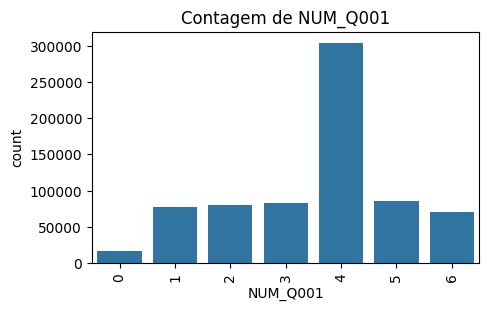

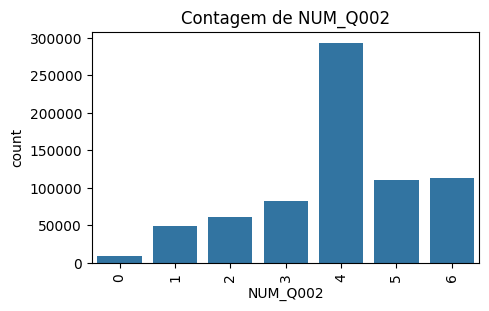

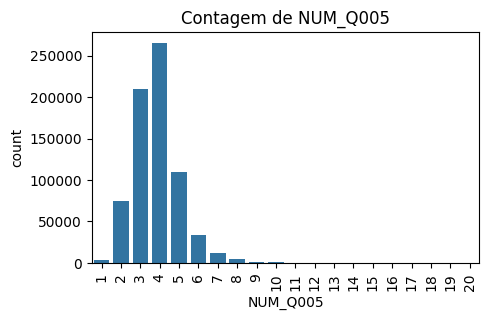

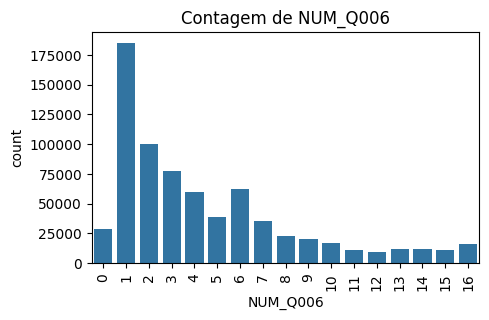

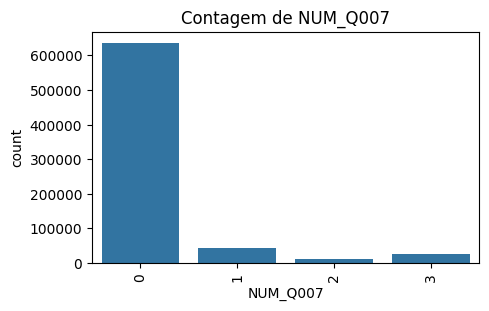

...

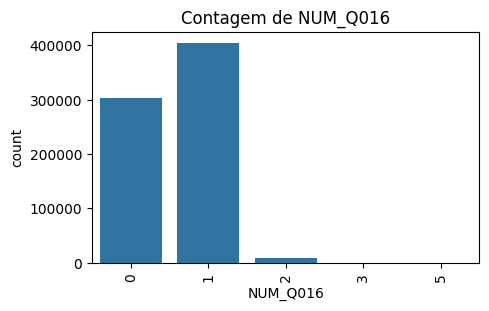

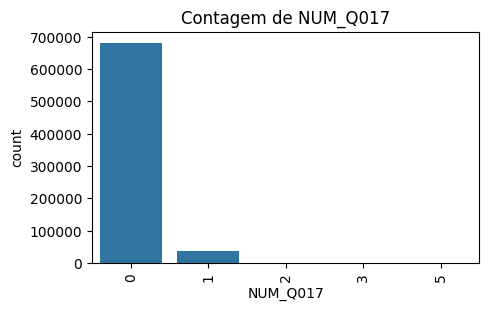

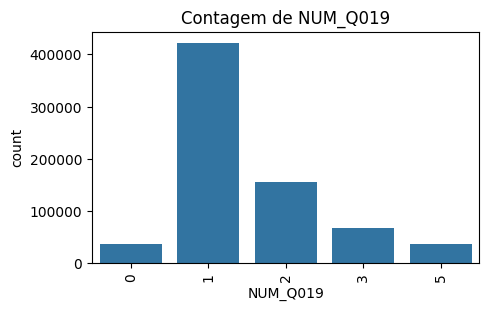

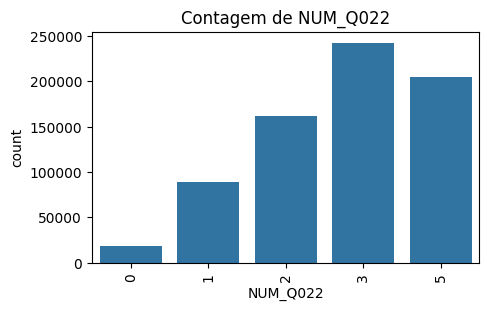

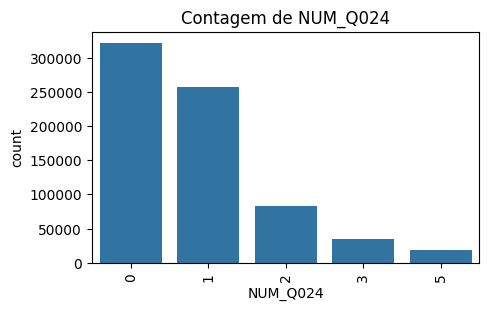

In [9]:
# gráfico de barras para variáveis numéricas com categorias
for col in df_enem_num.drop(columns=['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']).columns.to_list():
    plt.figure(figsize=(5, 3))
    sns.countplot(data=df_enem, x=col)
    plt.title(f'Contagem de {col}')
    plt.xticks(rotation=90)
    plt.show()

    3. Foco em outliers

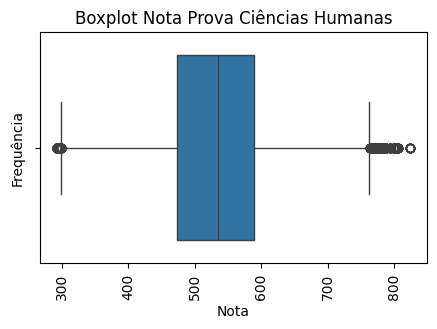

In [10]:
# boxplot para variáveis numéricas apenas Ciências Humanas
for col in ['NUM_NOTA_CH']:
    plt.figure(figsize=(5, 3))
    sns.boxplot(data=df_enem, x=col)
    plt.title(f'Boxplot Nota Prova Ciências Humanas')
    plt.xlabel('Nota')
    plt.ylabel('Frequência')
    plt.xticks(rotation=90)
    plt.show()

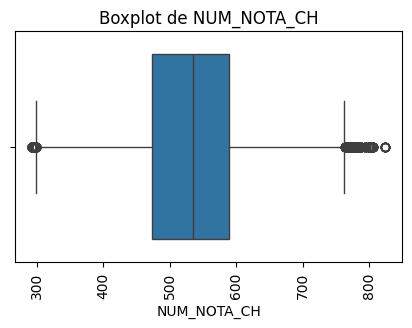

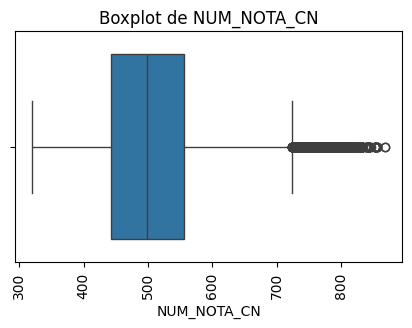

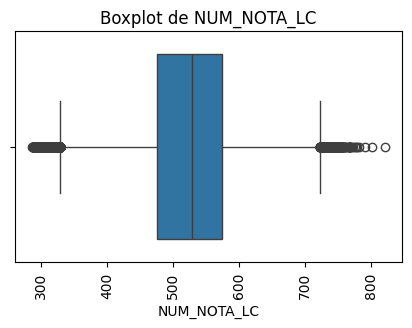

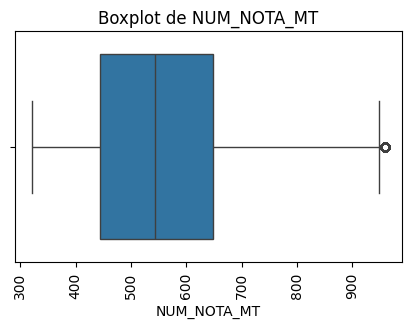

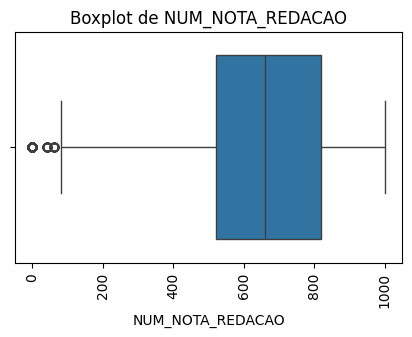

In [11]:
# boxplot para variáveis numéricas todas as notas
for col in ['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']:
    plt.figure(figsize=(5, 3))
    sns.boxplot(data=df_enem, x=col)
    plt.title(f'Boxplot de {col}')
    plt.xticks(rotation=90)
    plt.show()

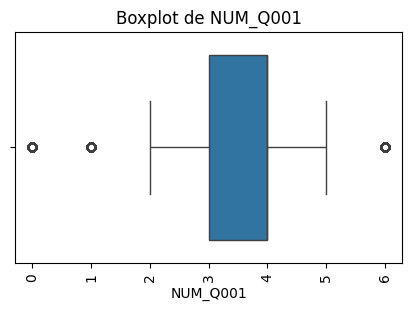

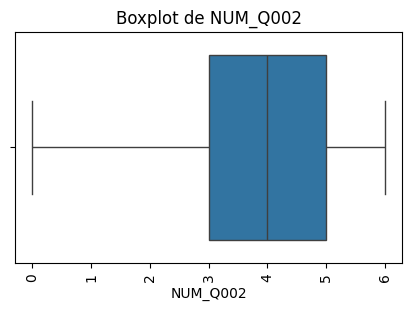

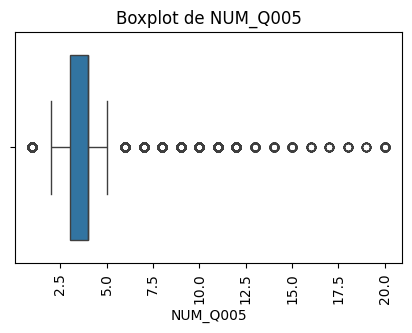

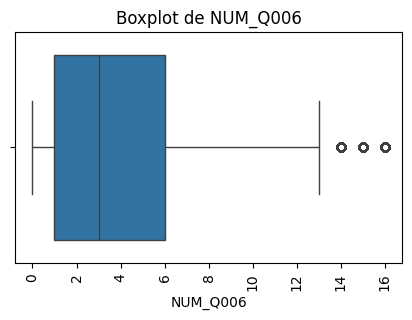

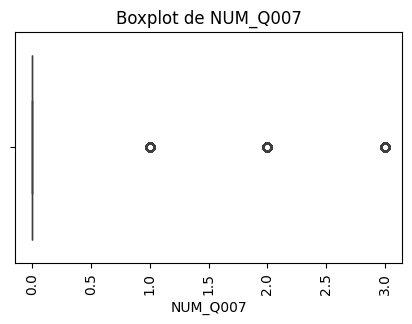

...

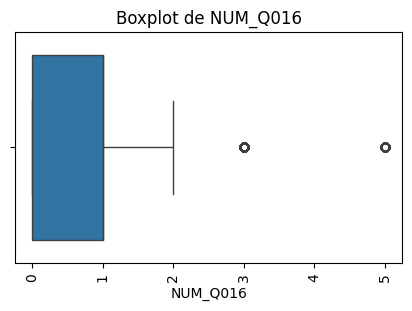

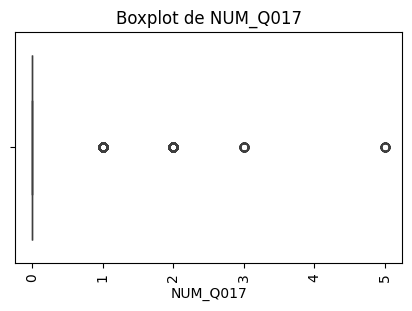

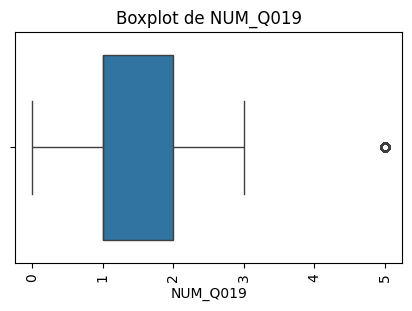

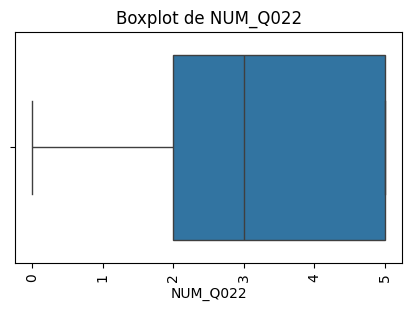

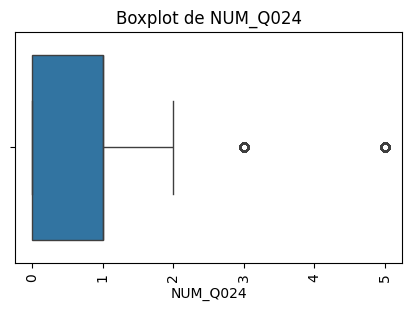

In [12]:
# boxplot para variáveis numéricas variáveis numéricas
for col in df_enem_num.drop(columns=['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']).columns.to_list():
    plt.figure(figsize=(5, 3))
    sns.boxplot(data=df_enem, x=col)
    plt.title(f'Boxplot de {col}')
    plt.xticks(rotation=90)
    plt.show()

### 3. Analise de correlações

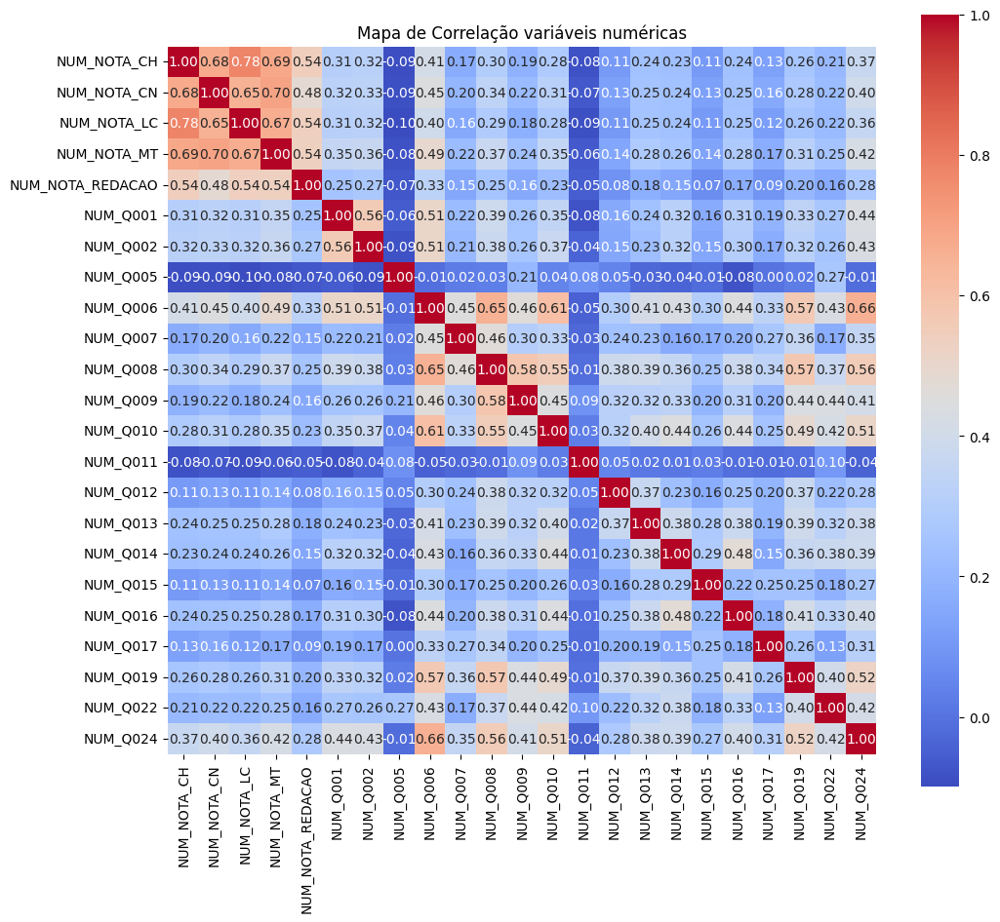

In [13]:
# mapa de correlação
plt.figure(figsize=(11, 11))
sns.heatmap(df_enem_num.corr(), annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Mapa de Correlação variáveis numéricas')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

#### 4. Relação com a variável alvo

C:\Users\ferra\AppData\Local\Temp\ipykernel_14692\2023983986.py:15: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
d:\Armazenamento\MBA\TCC\TccMbaUspEsalq\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


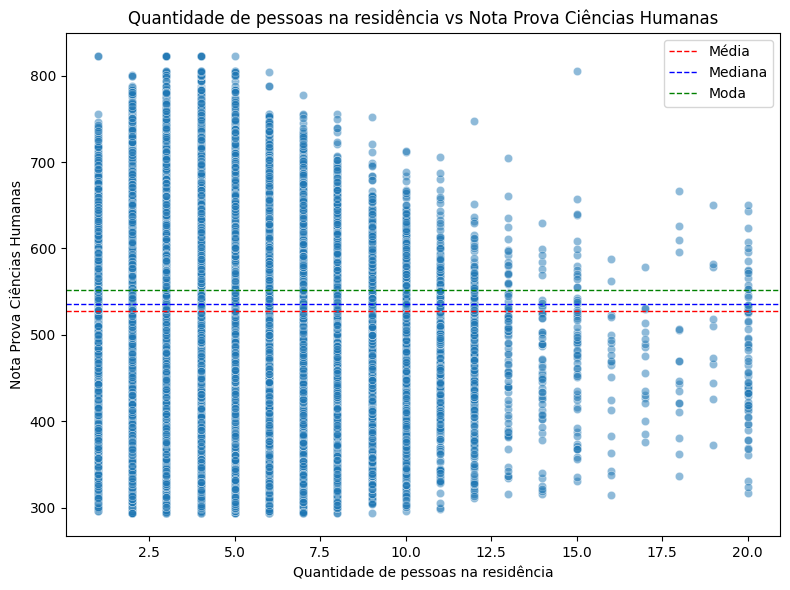

In [14]:
# Variável-alvo e variável numérica
target_var = 'NUM_NOTA_CH'
col = 'NUM_Q005'

# Criar scatterplot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_enem[col], y=df_enem[target_var], alpha=0.5)
plt.title(f'Quantidade de pessoas na residência vs Nota Prova Ciências Humanas')
plt.axhline(df_enem[target_var].mean(), color='red', linestyle='dashed', linewidth=1, label='Média')
plt.axhline(df_enem[target_var].median(), color='blue', linestyle='dashed', linewidth=1, label='Mediana')
plt.axhline(df_enem[target_var].mode()[0], color='green', linestyle='dashed', linewidth=1, label='Moda')
plt.xlabel('Quantidade de pessoas na residência')
plt.ylabel('Nota Prova Ciências Humanas')
plt.legend()
plt.tight_layout()
plt.show()

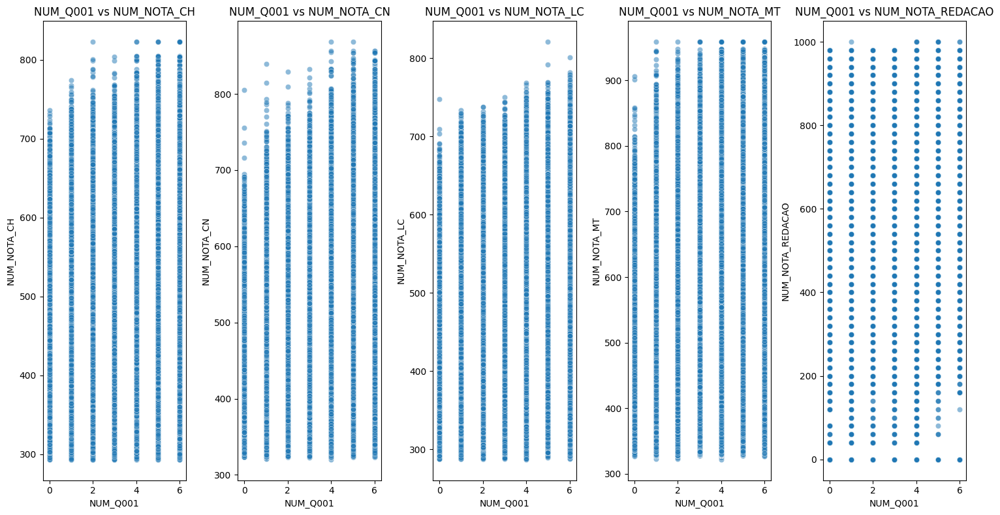

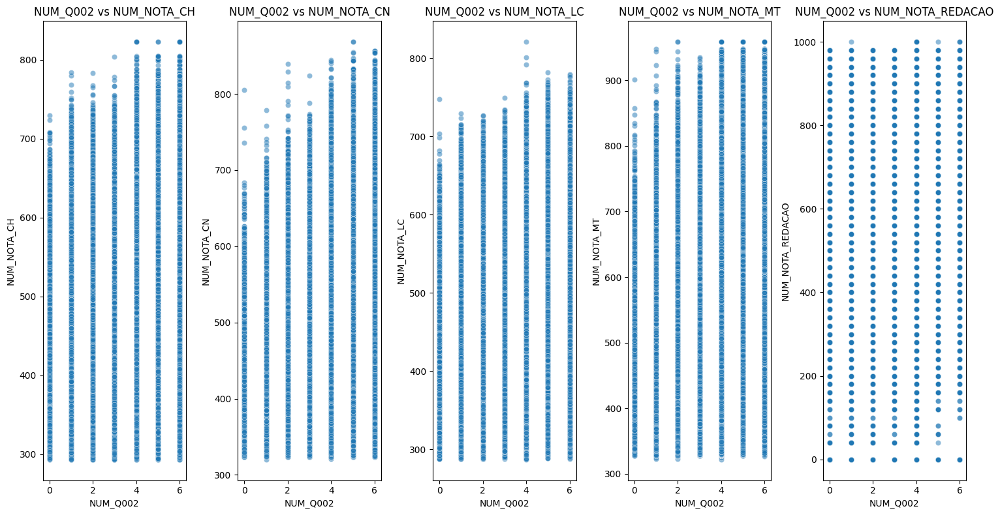

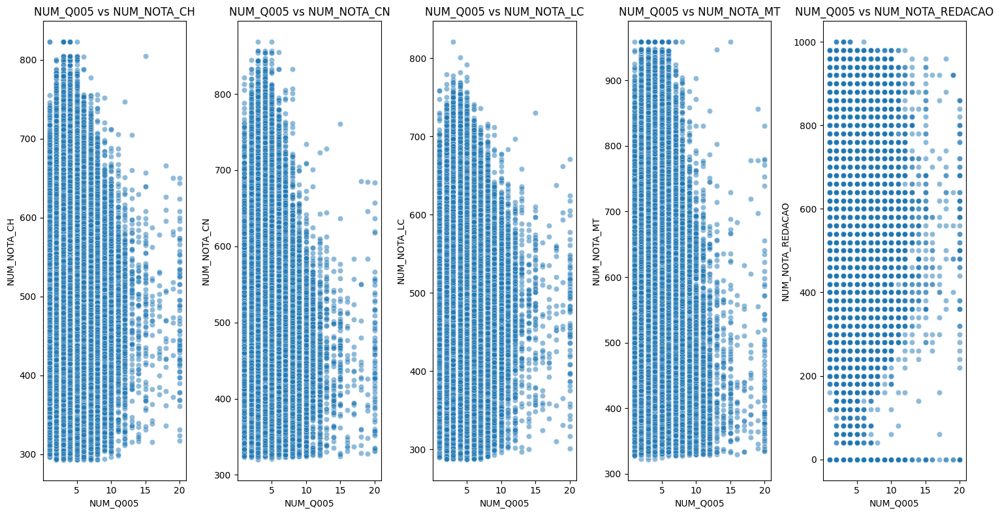

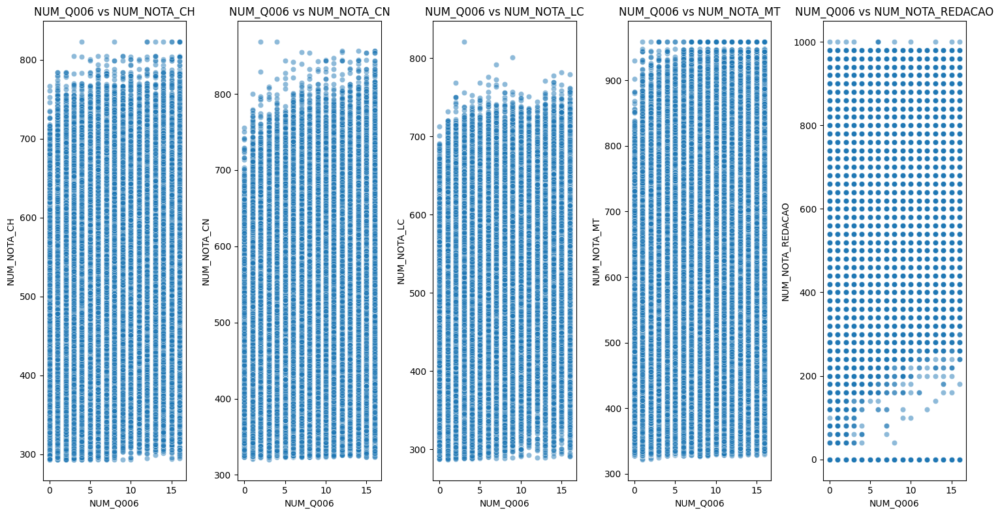

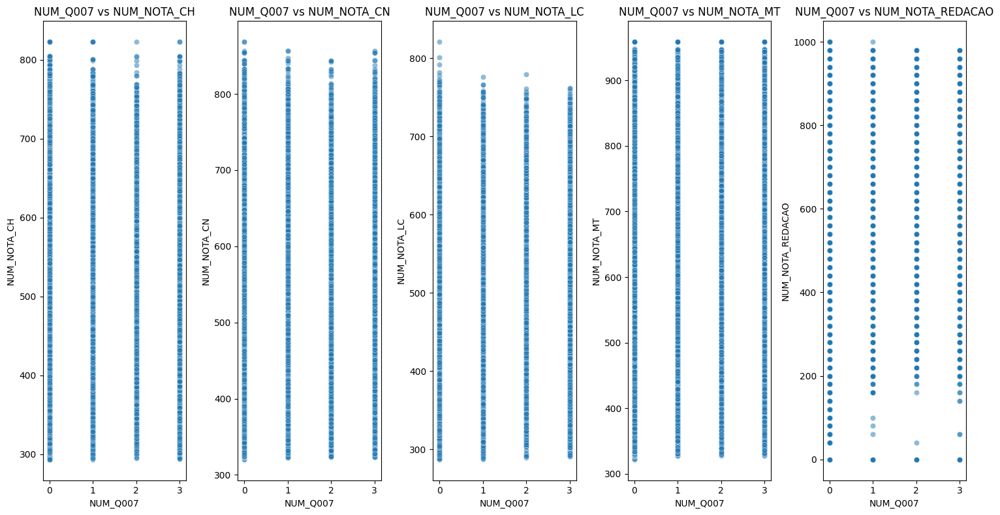

...

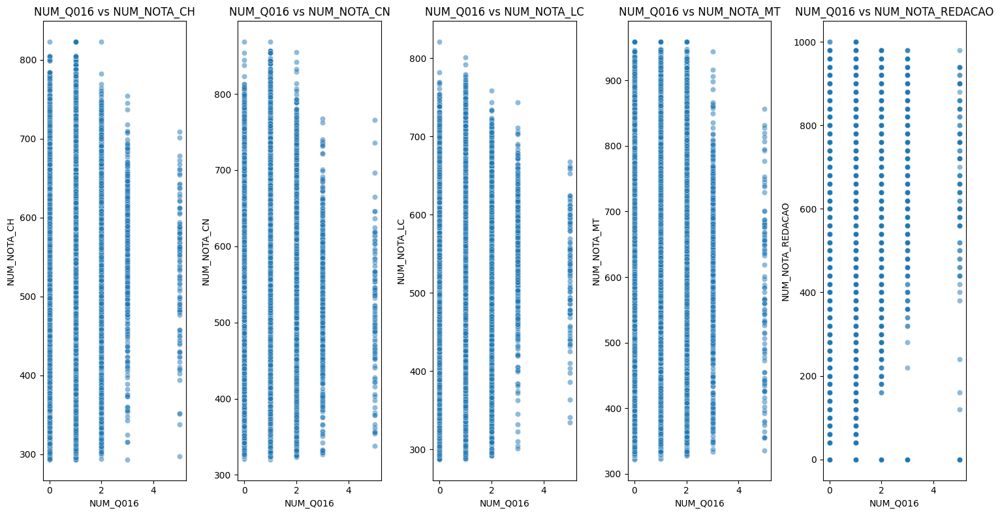

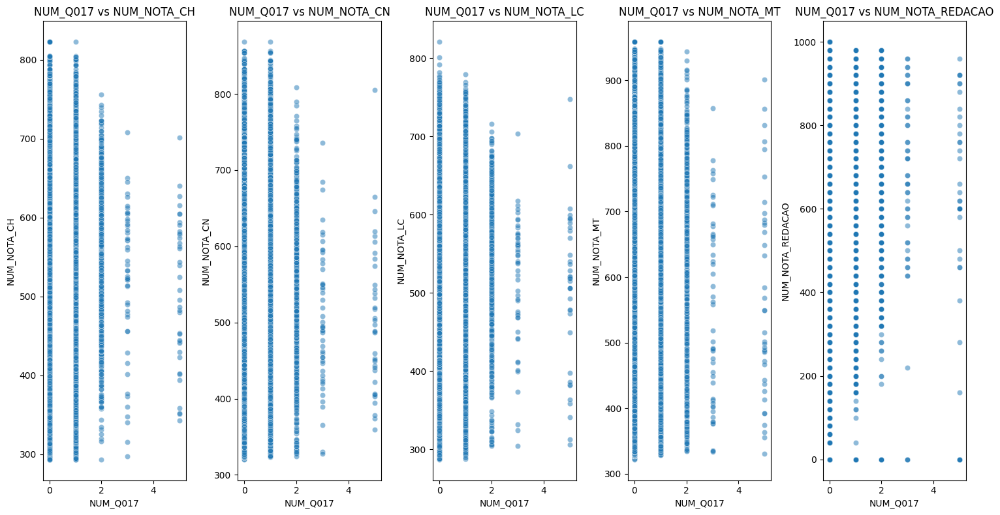

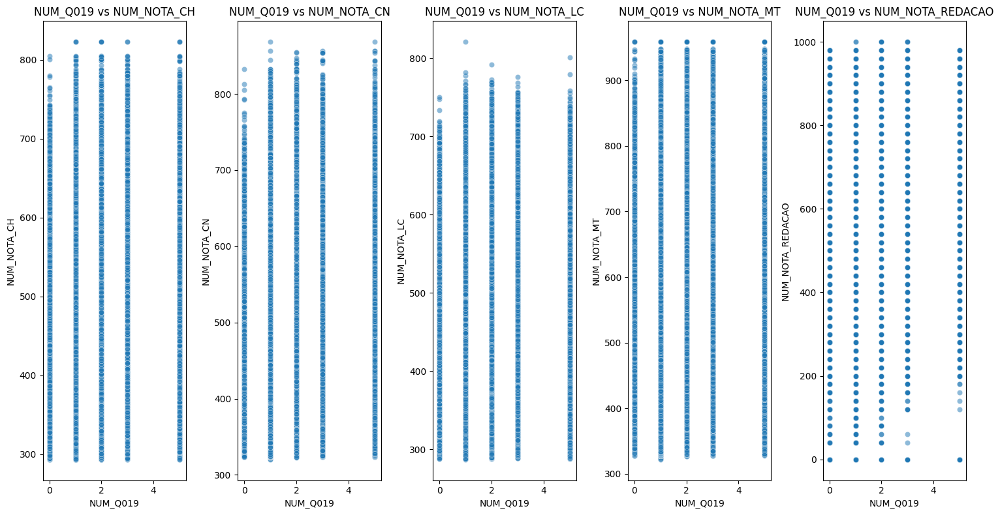

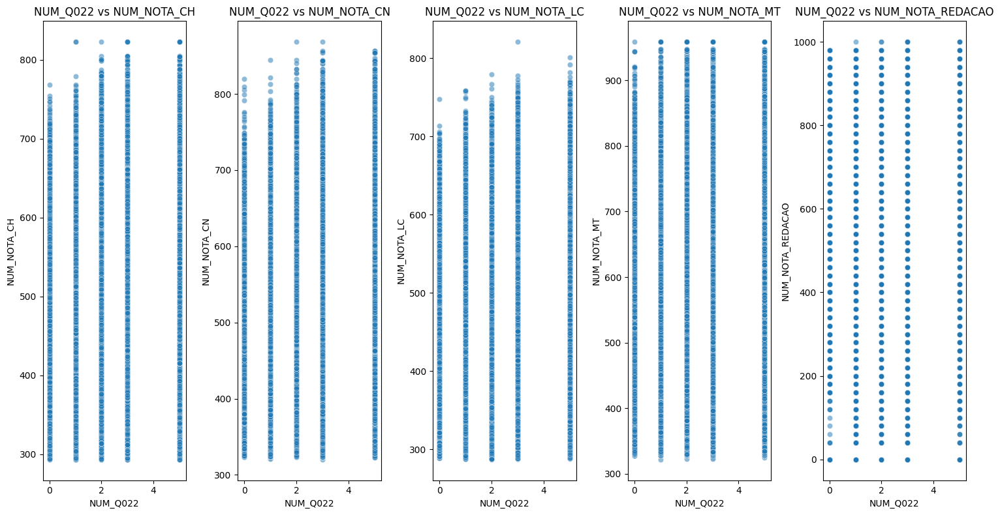

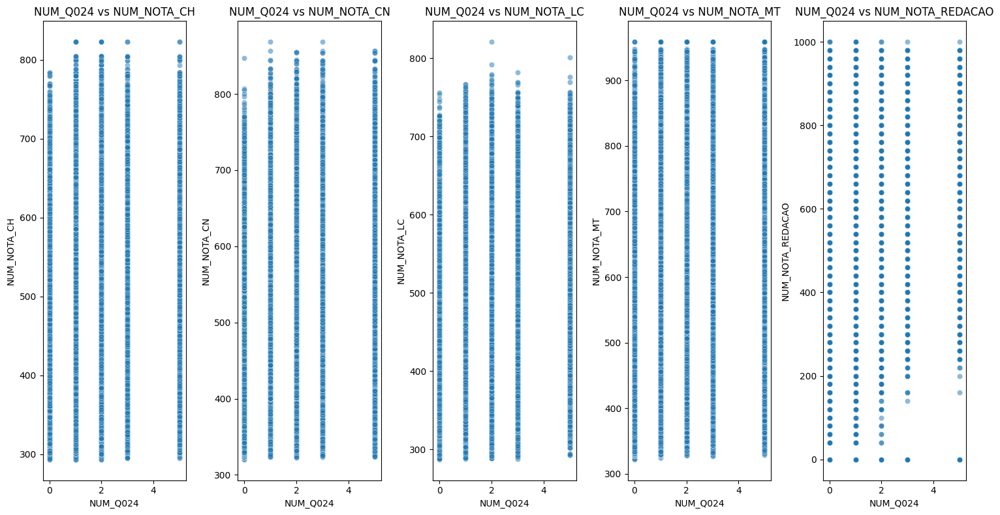

In [15]:
#relação entre variáveis numéricas e variáveis-alvo

# Lista de variáveis-alvo
target_vars = ['NUM_NOTA_CH', 'NUM_NOTA_CN', 'NUM_NOTA_LC', 'NUM_NOTA_MT', 'NUM_NOTA_REDACAO']

# Loop pelas variáveis numéricas
for col in df_enem_num.drop(columns=target_vars).columns:
    plt.figure(figsize=(15, 8))
    
    # Criar um subplot para cada variável-alvo
    for i, target in enumerate(target_vars, 1):
        plt.subplot(1, 5, i)
        sns.scatterplot(x=df_enem[col], y=df_enem[target], alpha=0.5)
        plt.title(f'{col} vs {target}')
        plt.xlabel(col)
        plt.ylabel(target)
    
    plt.tight_layout()
    plt.show()

#### 5. Analise variáveis binárias

    1. Verificar proporção entre verdadeiro e falsos

BIN_Q020
False    0.833399
True     0.166601
Name: proportion, dtype: float64


C:\Users\ferra\AppData\Local\Temp\ipykernel_14692\2752342756.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


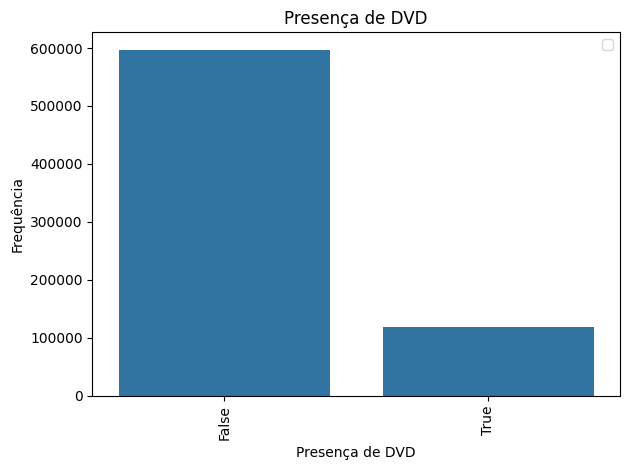

In [16]:
# proporção presença de DVD
for col in ['BIN_Q020']:
    print(df_enem[col].value_counts(normalize=True))
    sns.countplot(data=df_enem, x=col)
    plt.title(f'Presença de DVD')
    plt.xlabel('Presença de DVD')
    plt.ylabel('Frequência')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

BIN_Q001_DUMMY_H
False    0.895922
True     0.104078
Name: proportion, dtype: float64


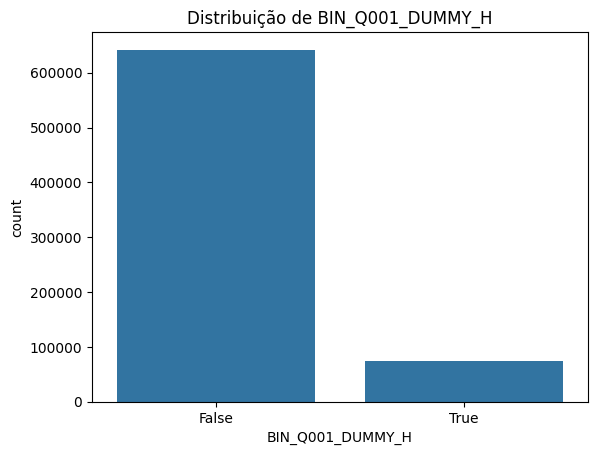

BIN_Q002_DUMMY_H
False    0.960485
True     0.039515
Name: proportion, dtype: float64


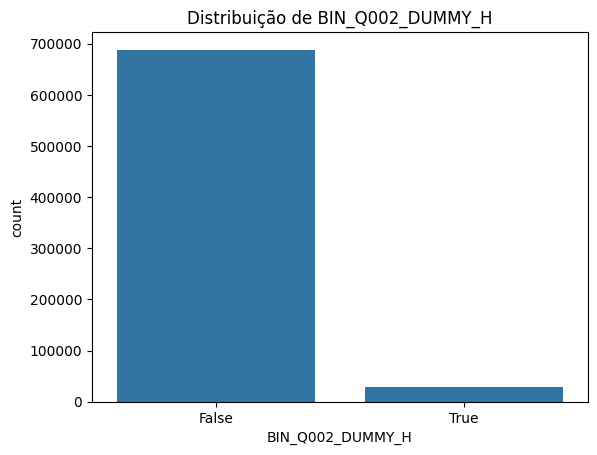

BIN_Q018
False    0.676422
True     0.323578
Name: proportion, dtype: float64


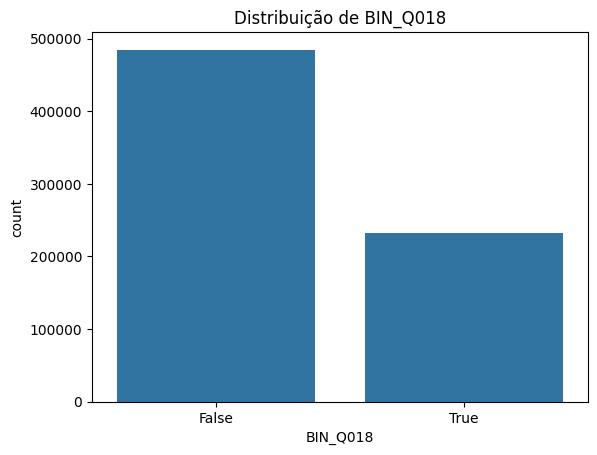

BIN_Q020
False    0.833399
True     0.166601
Name: proportion, dtype: float64


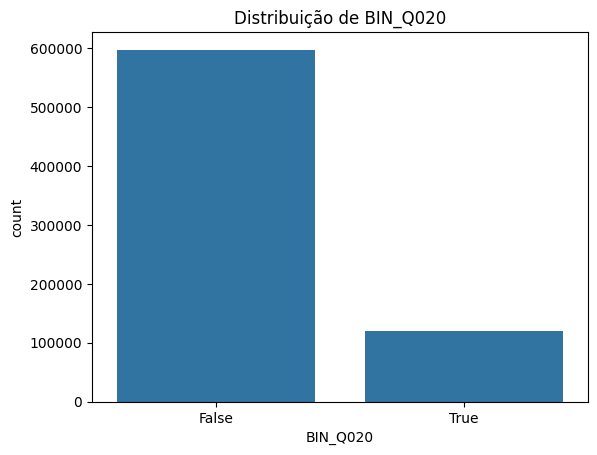

BIN_Q021
False    0.712677
True     0.287323
Name: proportion, dtype: float64


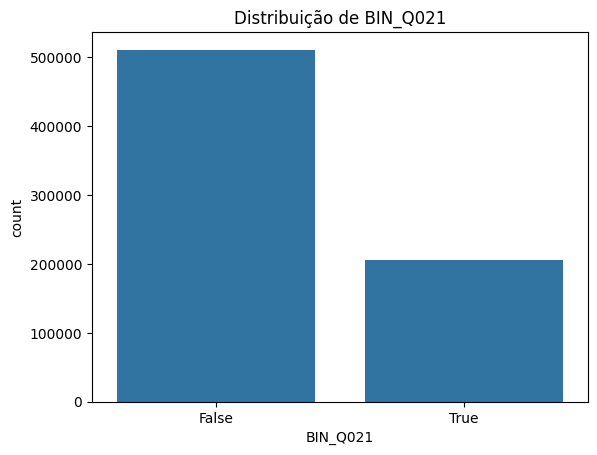

BIN_Q023
False    0.880225
True     0.119775
Name: proportion, dtype: float64


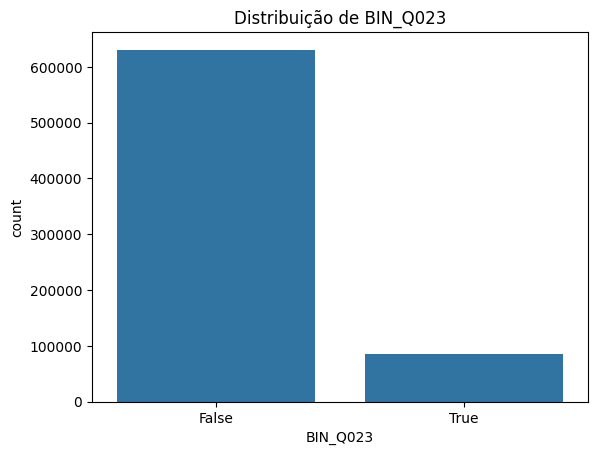

BIN_Q025
True     0.931613
False    0.068387
Name: proportion, dtype: float64


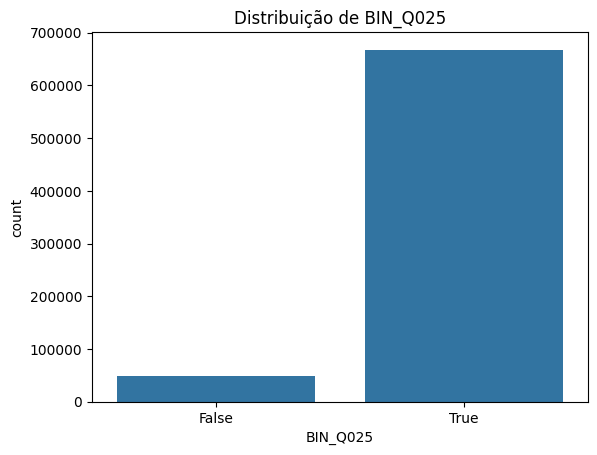

In [17]:
# proporção de cada binária
for col in df_enem_bin:
    print(df_enem[col].value_counts(normalize=True))
    sns.countplot(data=df_enem, x=col)
    plt.title(f'Distribuição de {col}')
    plt.show()

    2. Verificar se possuir verdadeiro (true) aumenta ou diminui a nota em geral

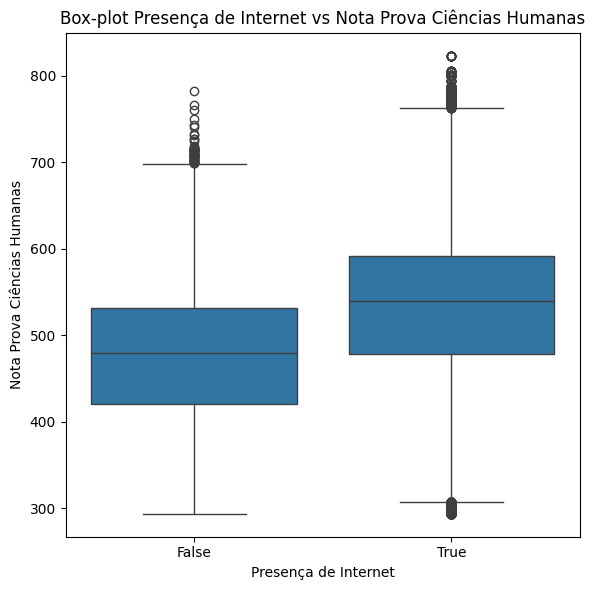

In [18]:
# Variável-alvo (nota de Ciências Humanas) e variável presença de Internet
target_var = 'NUM_NOTA_CH'
col = 'BIN_Q025'

# Criar boxplot
plt.figure(figsize=(6, 6))
sns.boxplot(x=df_enem[col], y=df_enem[target_var])
plt.title(f'Box-plot Presença de Internet vs Nota Prova Ciências Humanas')
plt.xlabel('Presença de Internet')
plt.ylabel('Nota Prova Ciências Humanas')
plt.tight_layout()
plt.show()

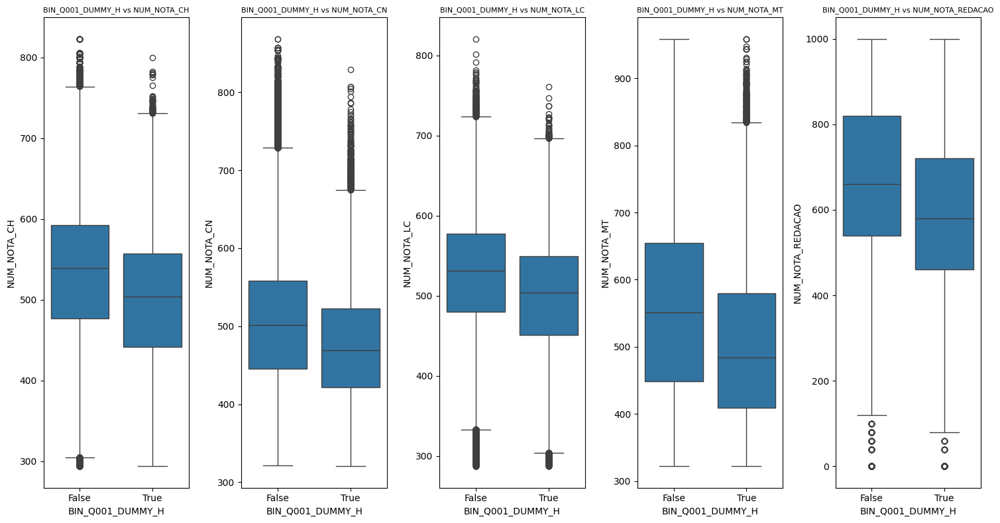

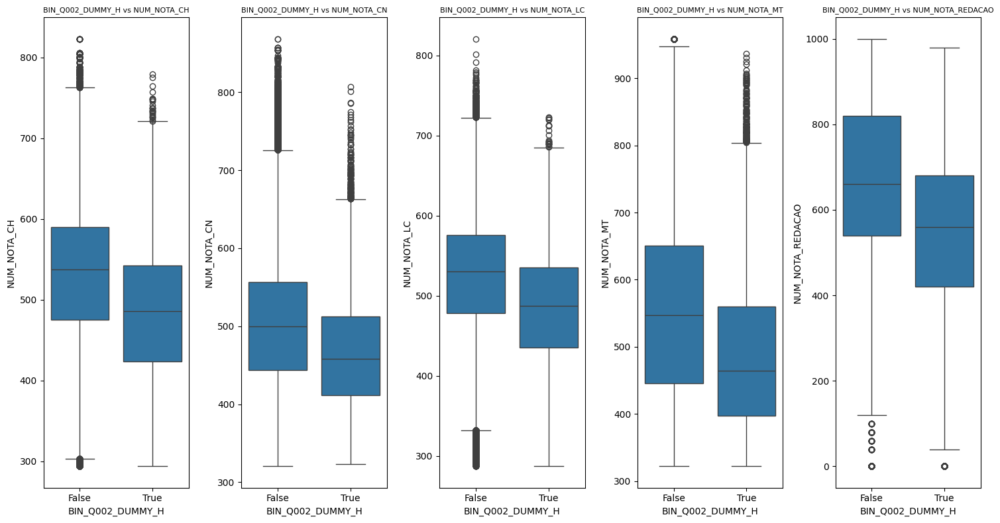

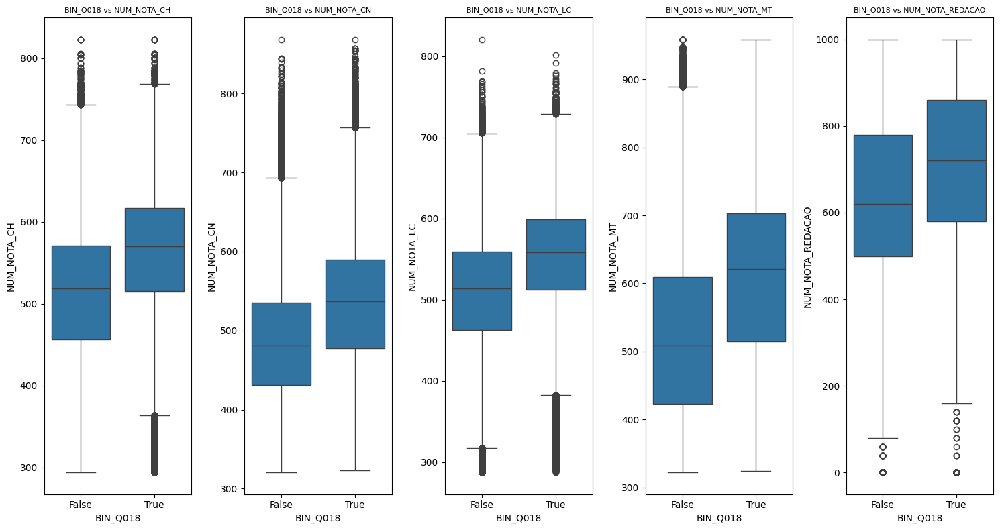

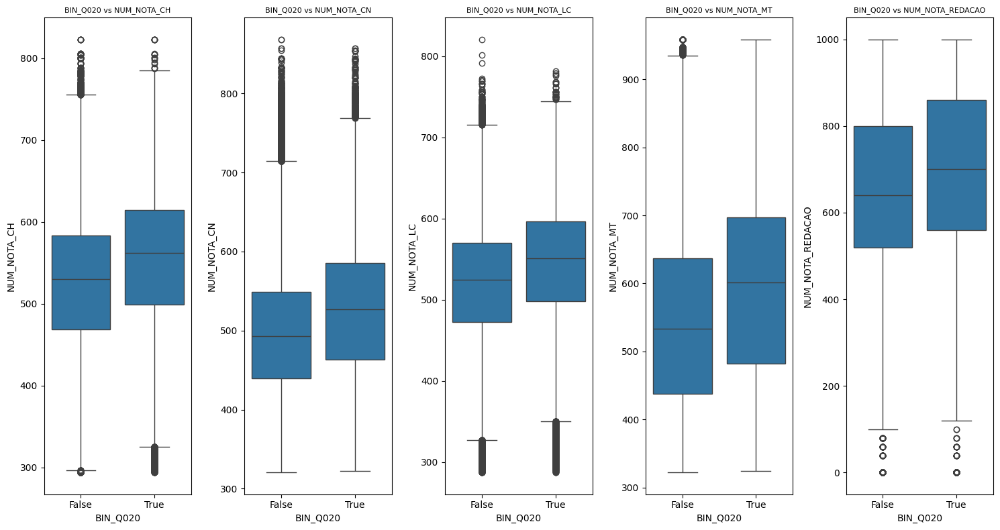

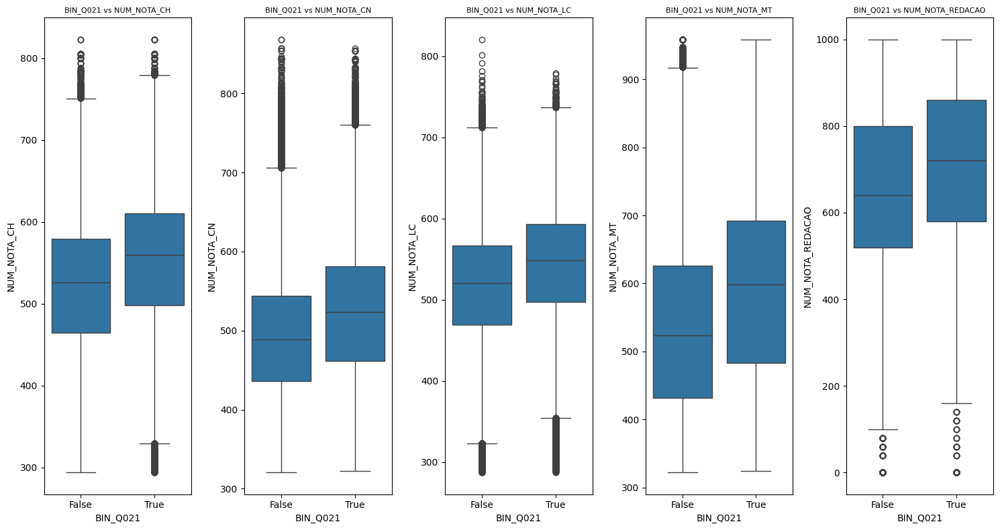

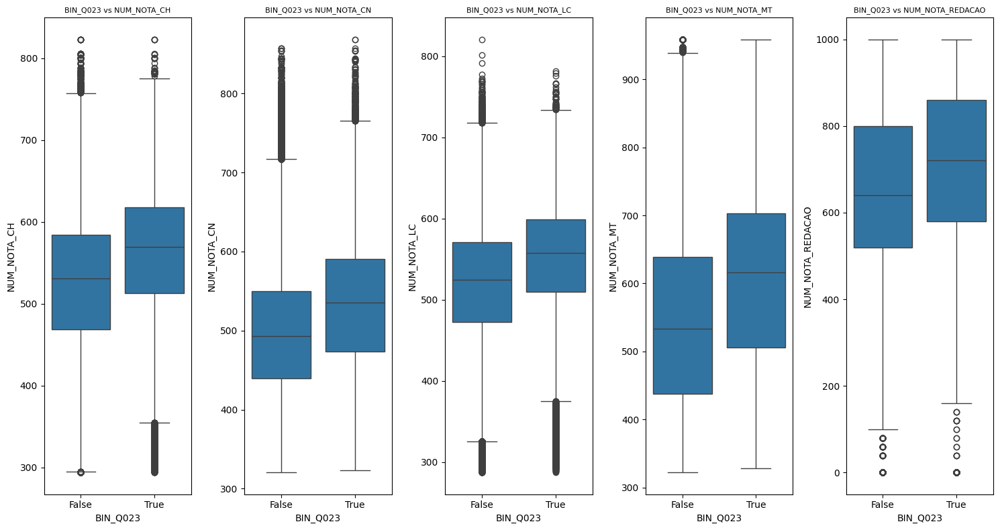

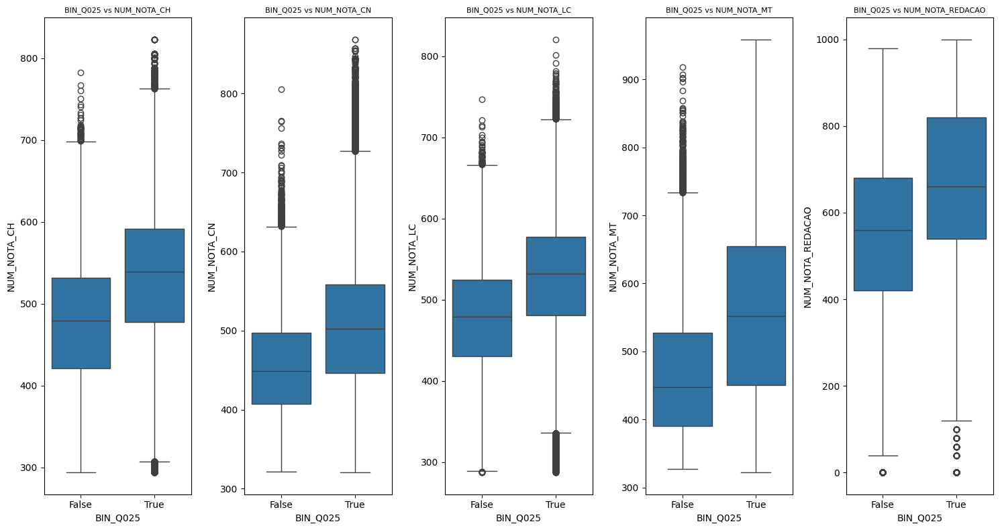

In [19]:
# relação de cada variável alvo com variéveis binárias
for col in df_enem_bin:
    plt.figure(figsize=(15, 8))
    
    # Criar um subplot para cada variável-alvo
    for i, target in enumerate(target_vars, 1):
        plt.subplot(1, 5, i)
        sns.boxplot(x=df_enem[col], y=df_enem[target])
        plt.title(f'{col} vs {target}', size=8)
        plt.xlabel(col)
        plt.ylabel(target)
    
    plt.tight_layout()
    plt.show()

#### 6. Analise variáveis categóricas

    1. Verificar classes desbalanceadas ou padrões claros

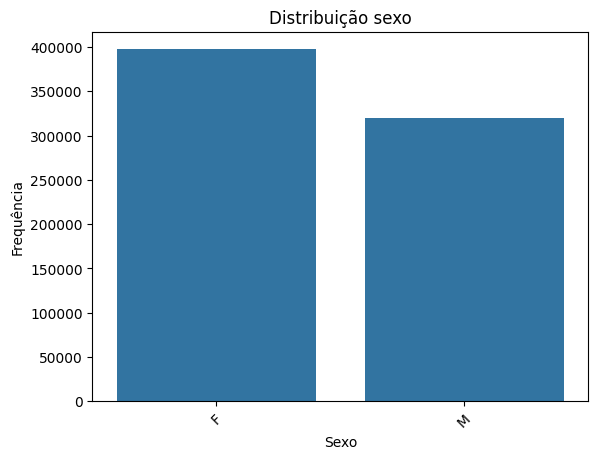

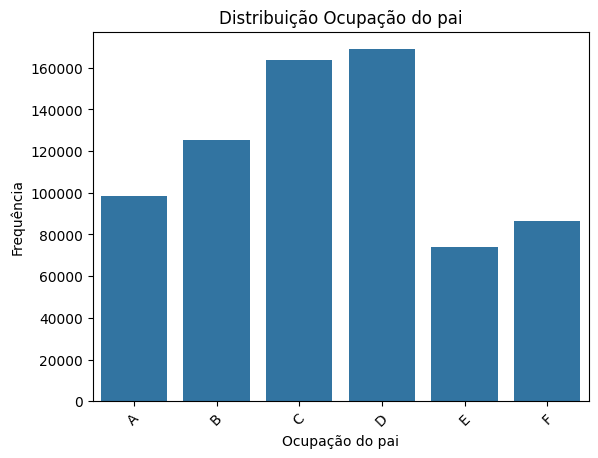

In [20]:
# Análise de frequência por sexo
for col in ['CAT_SEXO']:
    sns.countplot(data=df_enem, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Distribuição sexo')
    plt.xlabel('Sexo')
    plt.ylabel('Frequência')
    plt.show()

# Análise de frequência por ocupação do pai
for col in ['CAT_Q003']:
    sns.countplot(data=df_enem, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Distribuição Ocupação do pai')
    plt.xlabel('Ocupação do pai')
    plt.ylabel('Frequência')
    plt.show()

CAT_COR_RACA
1    347043
3    279526
2     68310
4     10380
0      8005
5      3306
Name: count, dtype: int64


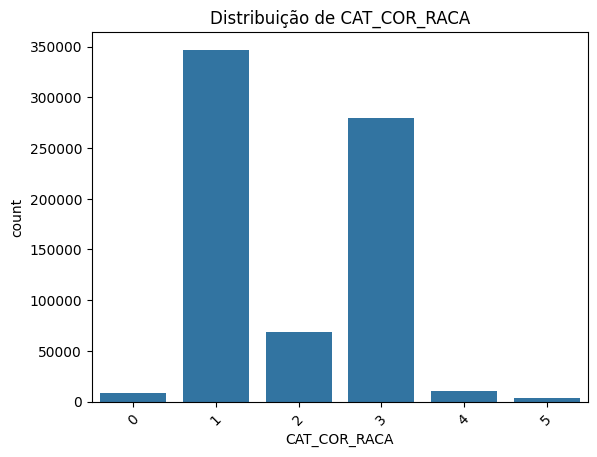

CAT_CO_UF_ESC
35    140603
23     73749
31     52557
33     49016
41     39614
29     34772
26     34442
43     31861
52     28099
15     27768
21     23365
42     23342
25     17921
53     16703
32     15986
22     14490
13     14490
24     14347
27     13838
51     12173
50      9180
28      8414
11      6974
17      4954
16      3436
12      2893
14      1583
Name: count, dtype: int64


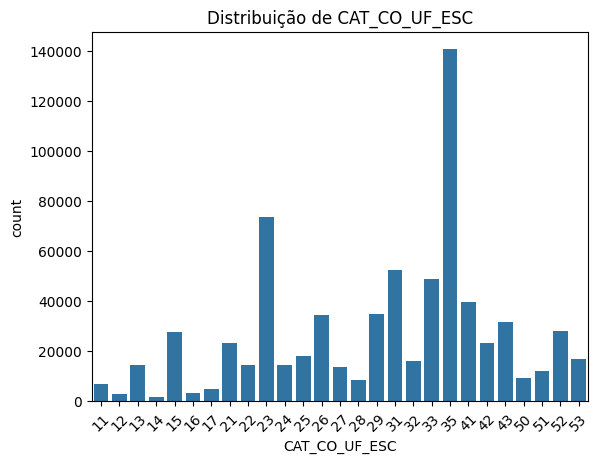

CAT_DEPENDENCIA_ADM_ESC
2    452851
4    214138
1     43797
3      5784
Name: count, dtype: int64


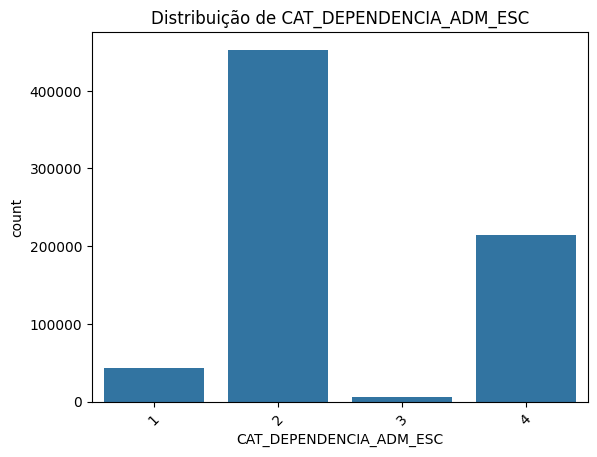

CAT_ENSINO
1    701708
0     12528
2      2334
Name: count, dtype: int64


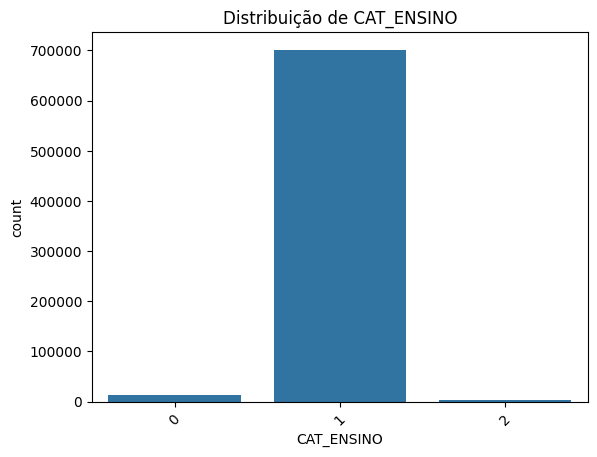

CAT_ESCOLA
2    522848
3    193722
1         0
Name: count, dtype: int64


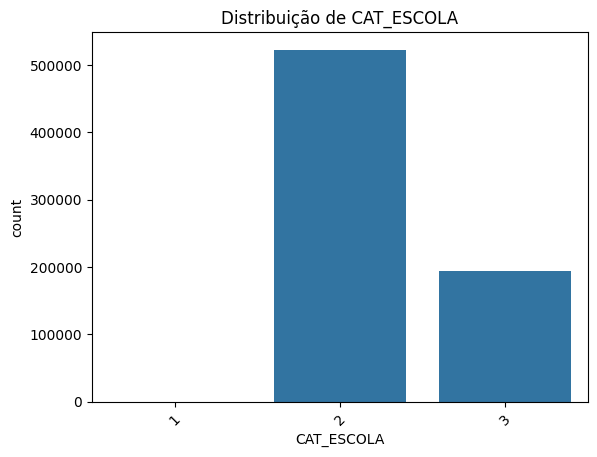

CAT_ESTADO_CIVIL
1    681344
0     25820
3      5108
2      4110
4       188
Name: count, dtype: int64


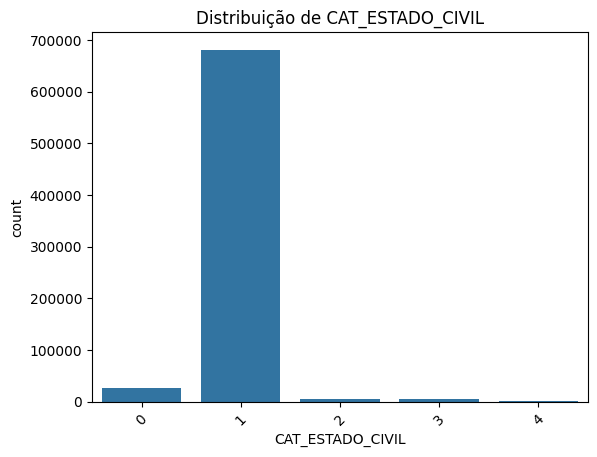

CAT_FAIXA_ETARIA
3     357048
2     285265
4      47279
5      10466
1       5573
6       3061
11      1412
7       1252
12       934
13       884
8        766
14       585
9        500
15       468
10       386
16       358
17       195
18        81
19        42
20        15
Name: count, dtype: int64


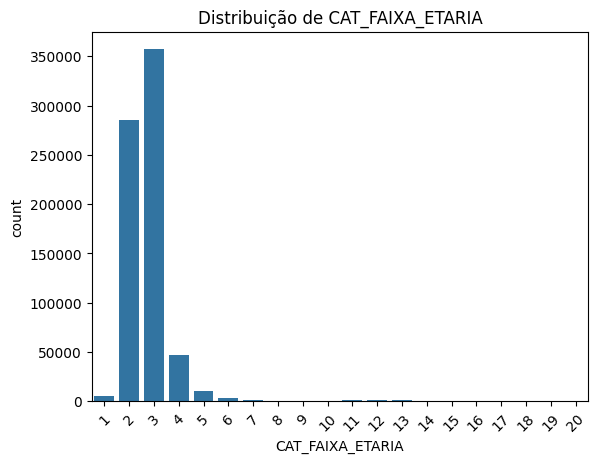

CAT_LINGUA
0    451138
1    265432
Name: count, dtype: int64


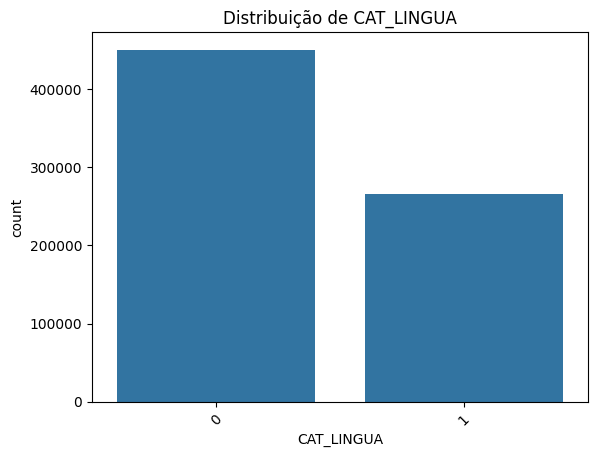

CAT_LOCALIZACAO_ESC
1    692465
2     24105
Name: count, dtype: int64


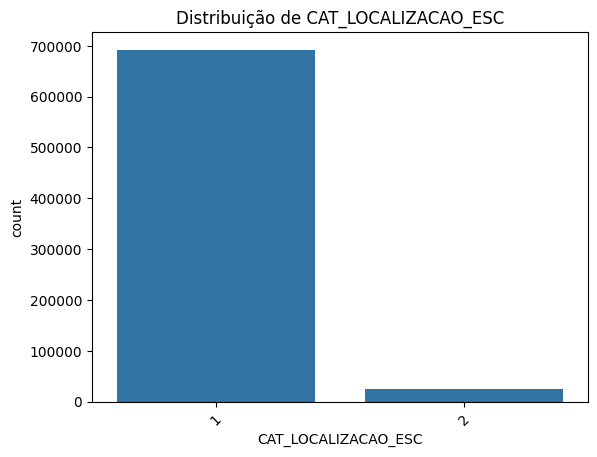

CAT_NACIONALIDADE
1    701522
2     11606
4      1954
3      1488
0         0
Name: count, dtype: int64


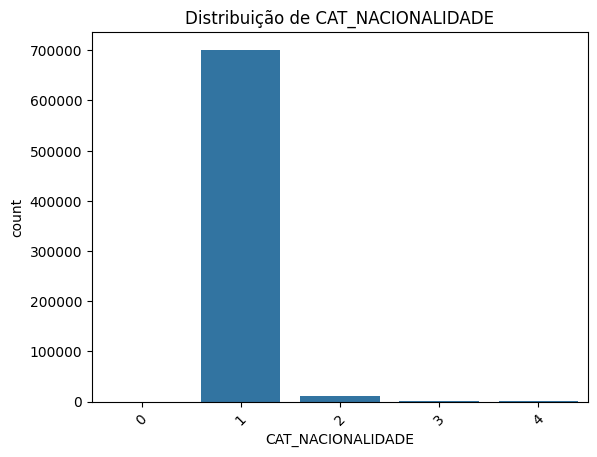

CAT_Q003
D    168871
C    163495
B    125388
A     98230
F     86510
E     74076
Name: count, dtype: int64


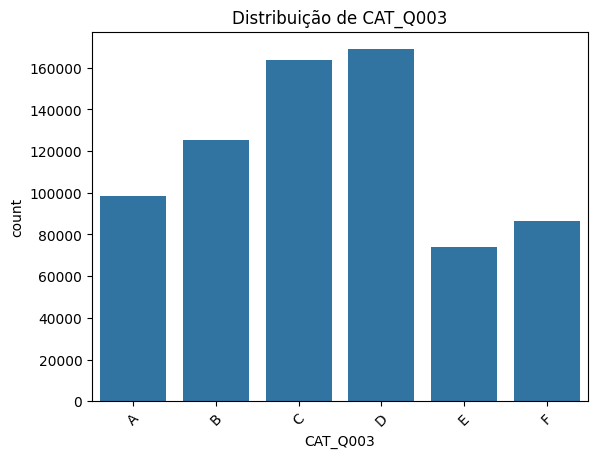

CAT_Q004
B    260469
D    208819
A     77203
F     67513
E     55788
C     46778
Name: count, dtype: int64


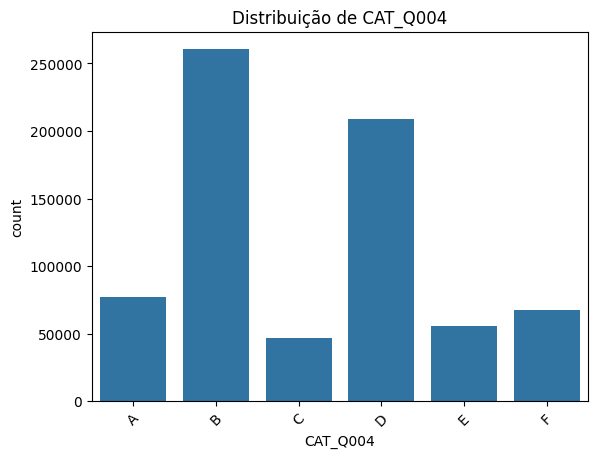

CAT_SEXO
F    397265
M    319305
Name: count, dtype: int64


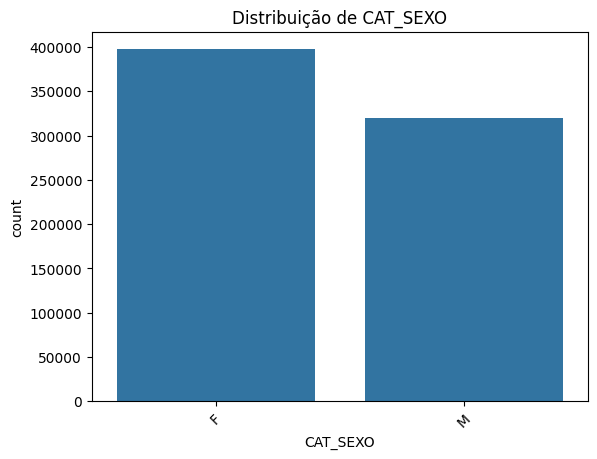

CAT_SIT_FUNC_ESC
1    710469
4      3131
2      2534
3       436
Name: count, dtype: int64


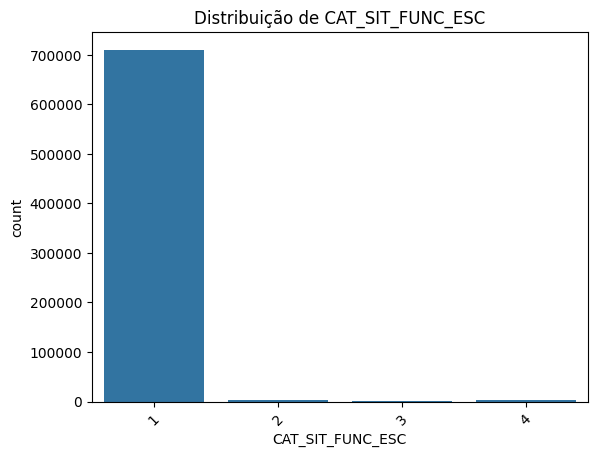

In [21]:
# Análise de frequência por variável categórica
for col in df_enem_cat.drop(columns=['CAT_CO_MUNICIPIO_ESC']):
    print(df_enem[col].value_counts())
    sns.countplot(data=df_enem, x=col)
    plt.xticks(rotation=45)
    plt.title(f'Distribuição de {col}')
    plt.show()


    2. Box-plot por categoria

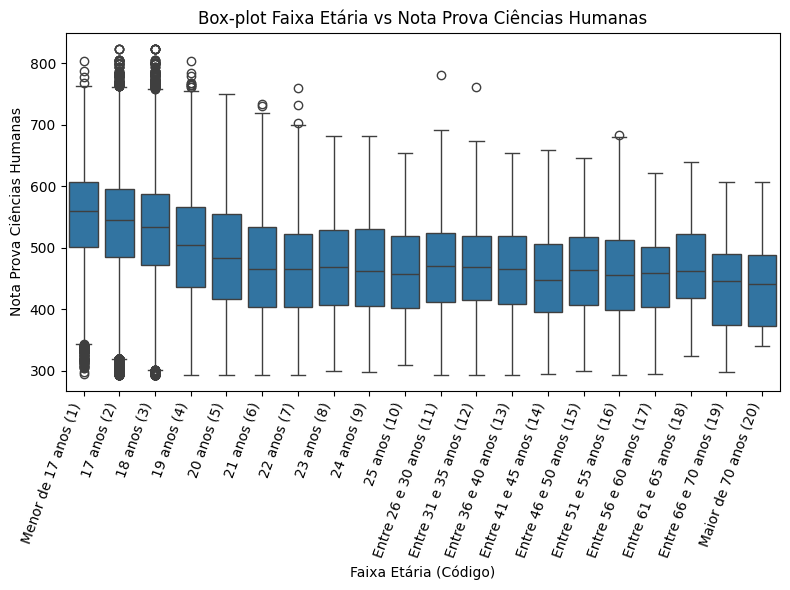

In [22]:
# Criar boxplot com rótulos das faixas etárias e nota de Ciências Humanas
target_var = 'NUM_NOTA_CH'
col = 'CAT_FAIXA_ETARIA'

# Dicionário com os significados das faixas etárias
faixa_etaria_labels = {
    'Menor de 17 anos': '1',
    '17 anos': '2',
    '18 anos': '3',
    '19 anos': '4',
    '20 anos': '5',
    '21 anos': '6',
    '22 anos': '7',
    '23 anos': '8',
    '24 anos': '9',
    '25 anos': '10',
    'Entre 26 e 30 anos': '11',
    'Entre 31 e 35 anos': '12',
    'Entre 36 e 40 anos': '13',
    'Entre 41 e 45 anos': '14',
    'Entre 46 e 50 anos': '15',
    'Entre 51 e 55 anos': '16',
    'Entre 56 e 60 anos': '17',
    'Entre 61 e 65 anos': '18',
    'Entre 66 e 70 anos': '19',
    'Maior de 70 anos': '20'
}

# Criar boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(x=df_enem[col], y=df_enem[target_var])

# Ajustar os rótulos do eixo X
plt.xticks(
    ticks=range(len(faixa_etaria_labels)),
    labels=[f"{faixa} ({codigo})" for faixa, codigo in faixa_etaria_labels.items()],
    rotation=70,
    ha='right'
)

plt.title('Box-plot Faixa Etária vs Nota Prova Ciências Humanas')
plt.xlabel('Faixa Etária (Código)')
plt.ylabel('Nota Prova Ciências Humanas')
plt.tight_layout()
plt.show()

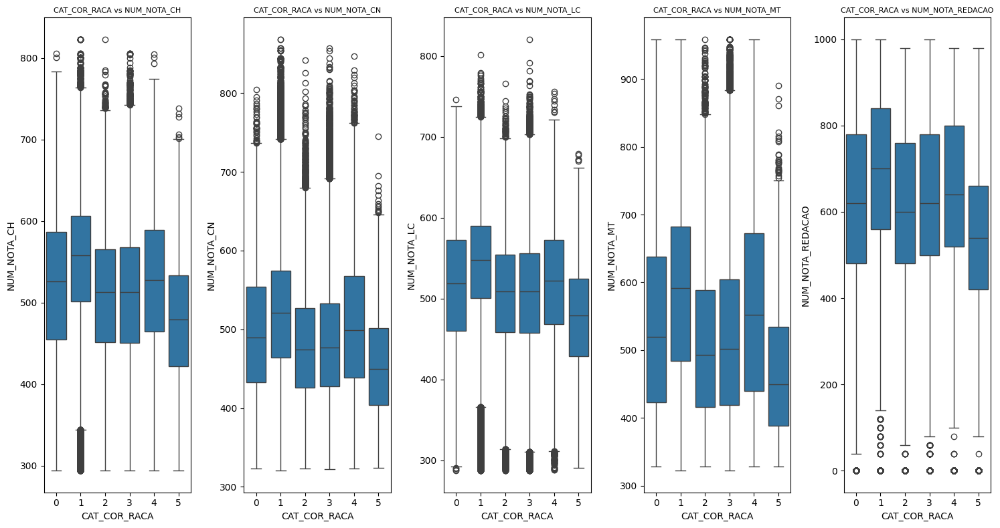

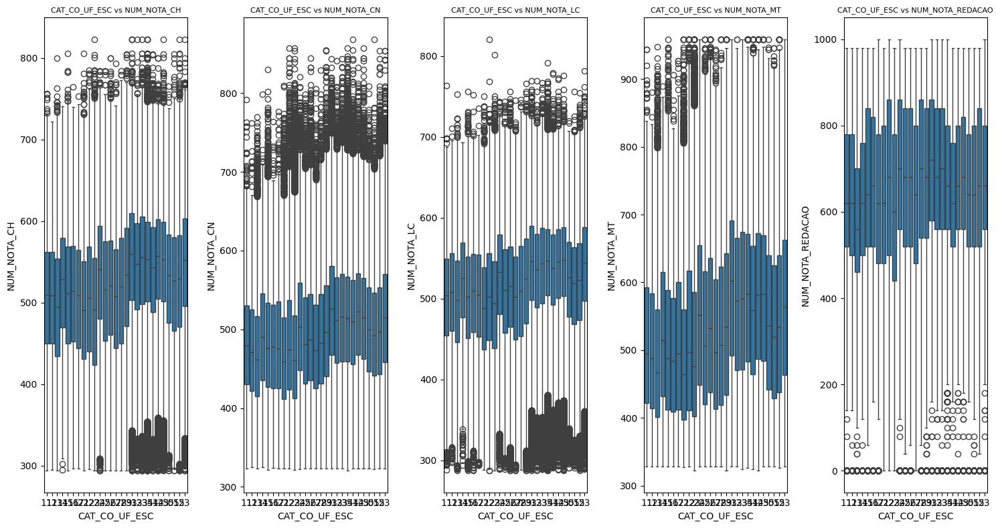

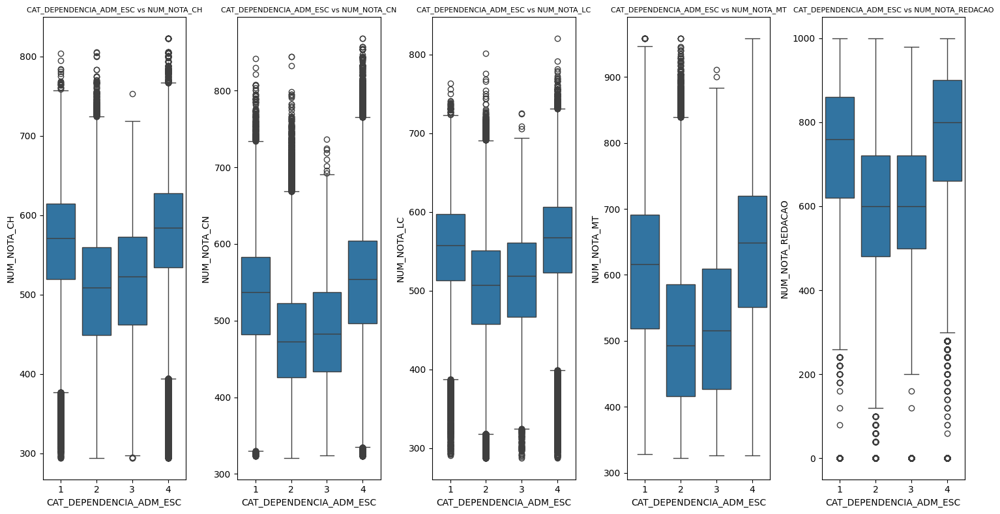

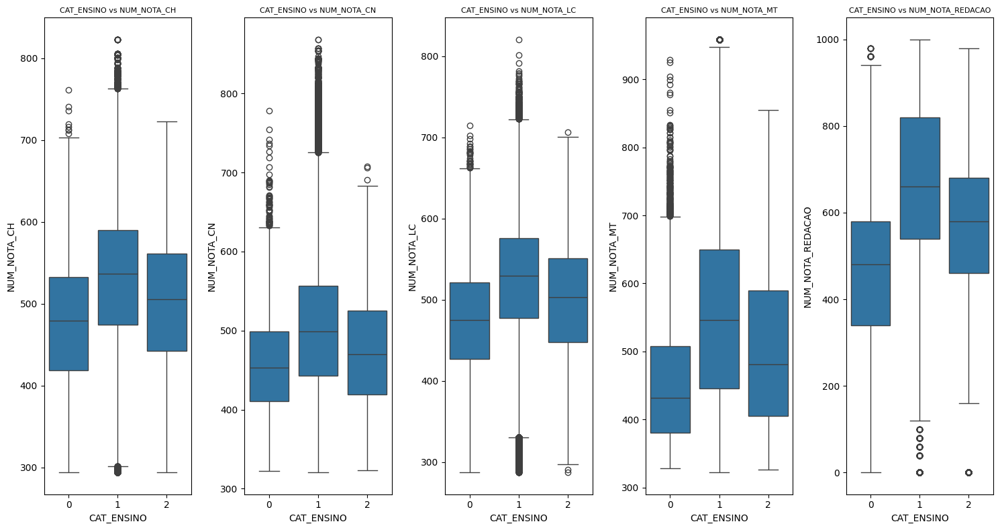

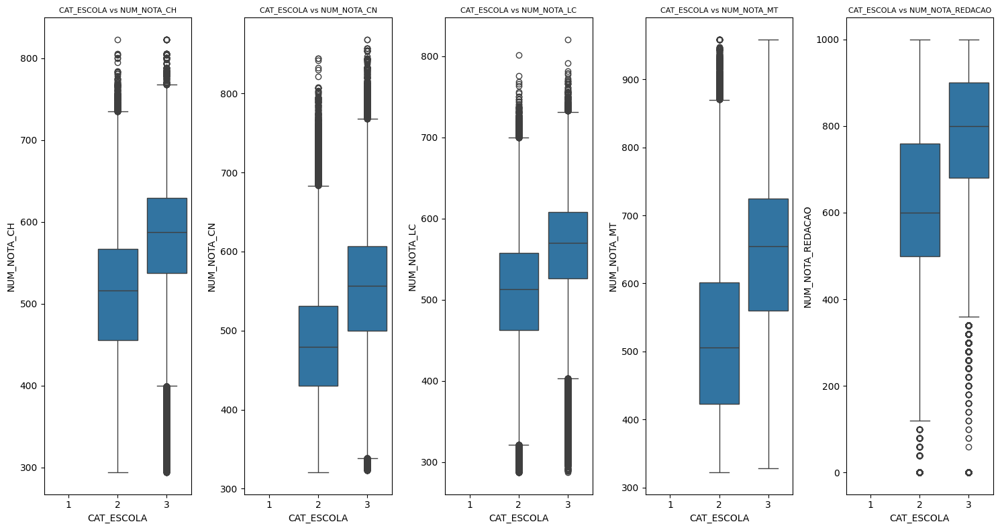

...

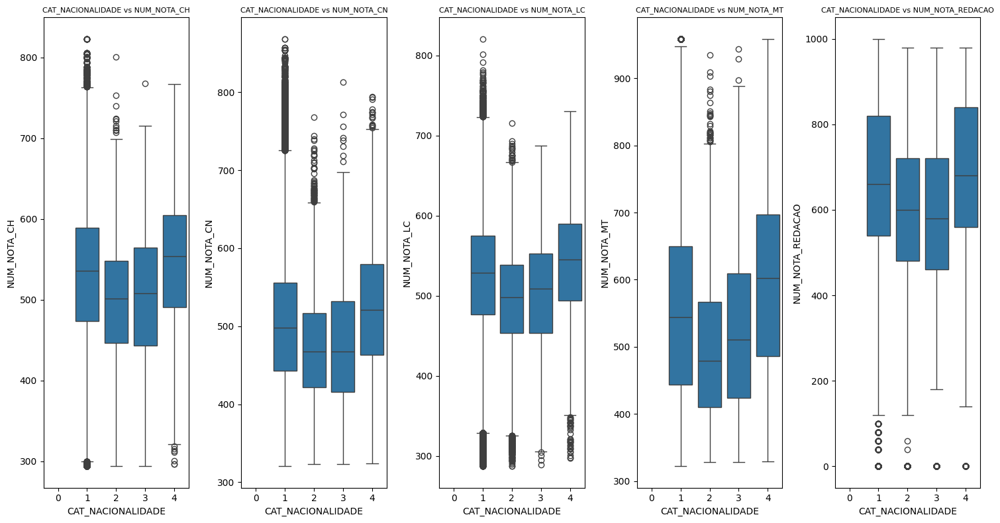

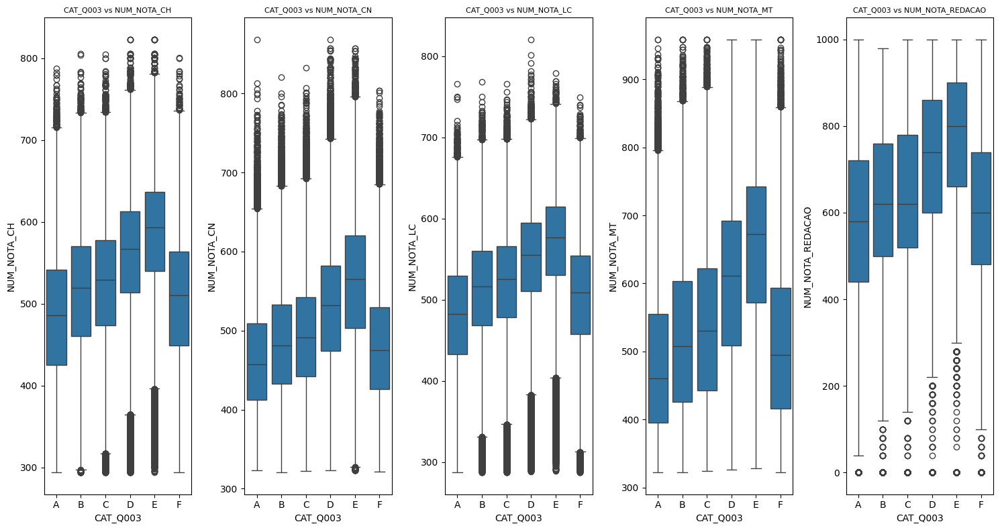

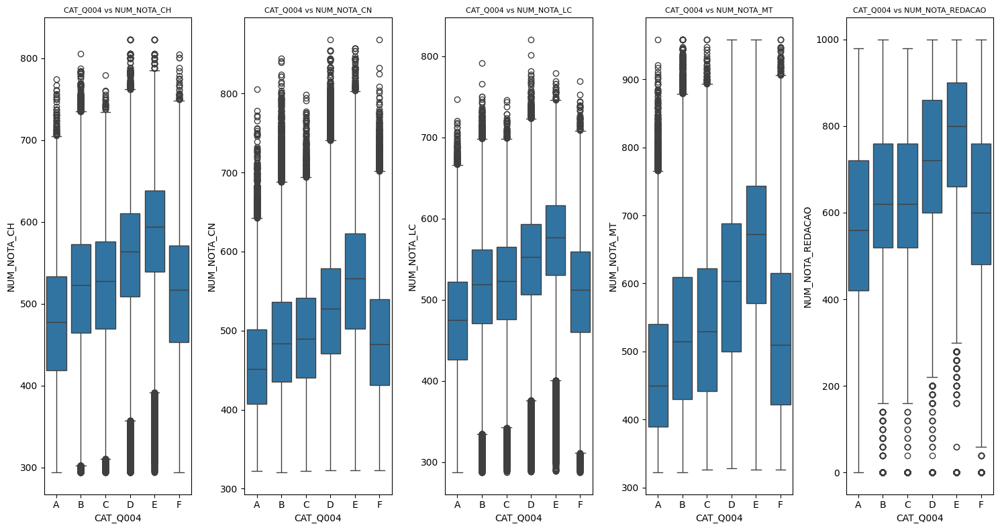

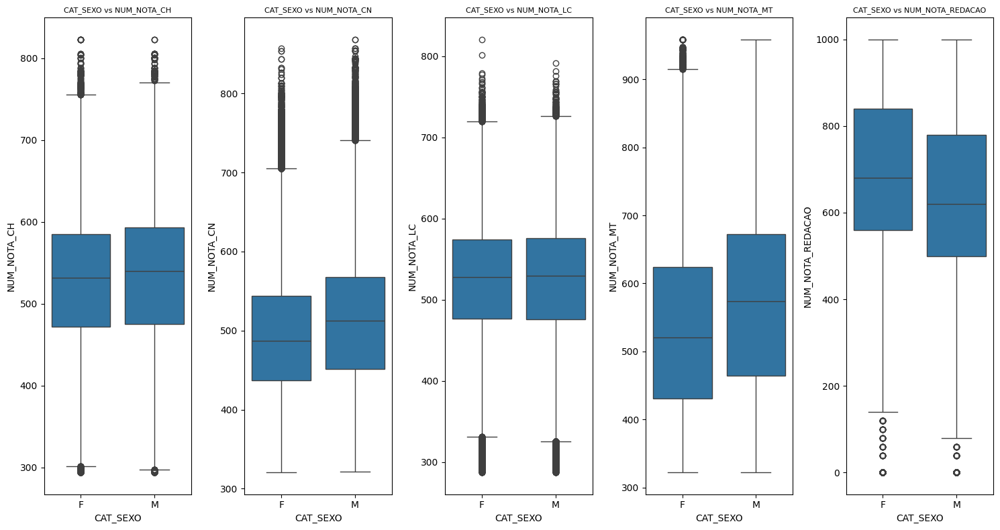

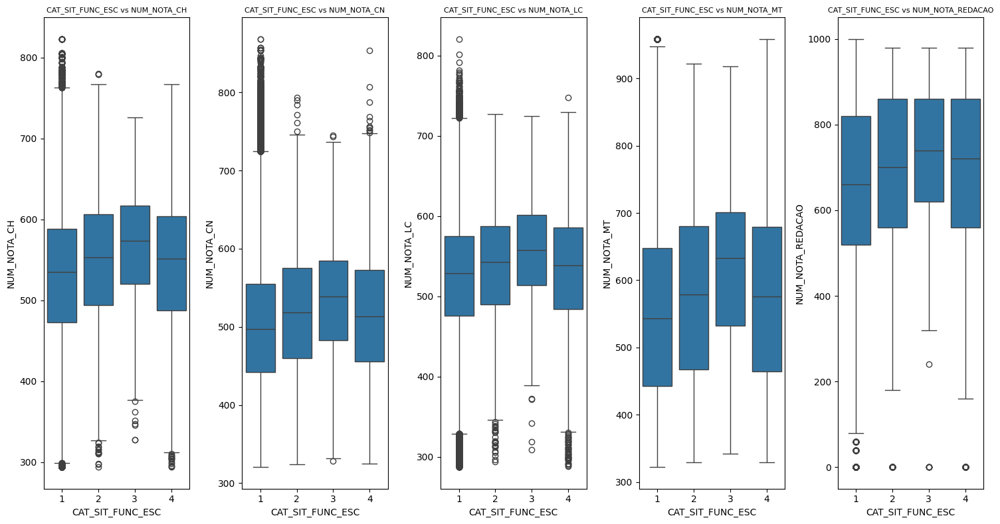

In [23]:
# porporção categoria por alvo com todas as notas
for col in df_enem_cat.drop(columns=['CAT_CO_MUNICIPIO_ESC']):
    plt.figure(figsize=(15, 8))
    
    # Criar um subplot para cada variável-alvo
    for i, target in enumerate(target_vars, 1):
        plt.subplot(1, 5, i)
        sns.boxplot(x=df_enem[col], y=df_enem[target])
        plt.title(f'{col} vs {target}', size=8)
        plt.xlabel(col)
        plt.ylabel(target)
    
    plt.tight_layout()
    plt.show()

#### 7. Cross-tab

In [24]:
df_enem_cat.columns.to_list()

['CAT_COR_RACA',
 'CAT_CO_MUNICIPIO_ESC',
 'CAT_CO_UF_ESC',
 'CAT_DEPENDENCIA_ADM_ESC',
 'CAT_ENSINO',
 'CAT_ESCOLA',
 'CAT_ESTADO_CIVIL',
 'CAT_FAIXA_ETARIA',
 'CAT_LINGUA',
 'CAT_LOCALIZACAO_ESC',
 'CAT_NACIONALIDADE',
 'CAT_Q003',
 'CAT_Q004',
 'CAT_SEXO',
 'CAT_SIT_FUNC_ESC']

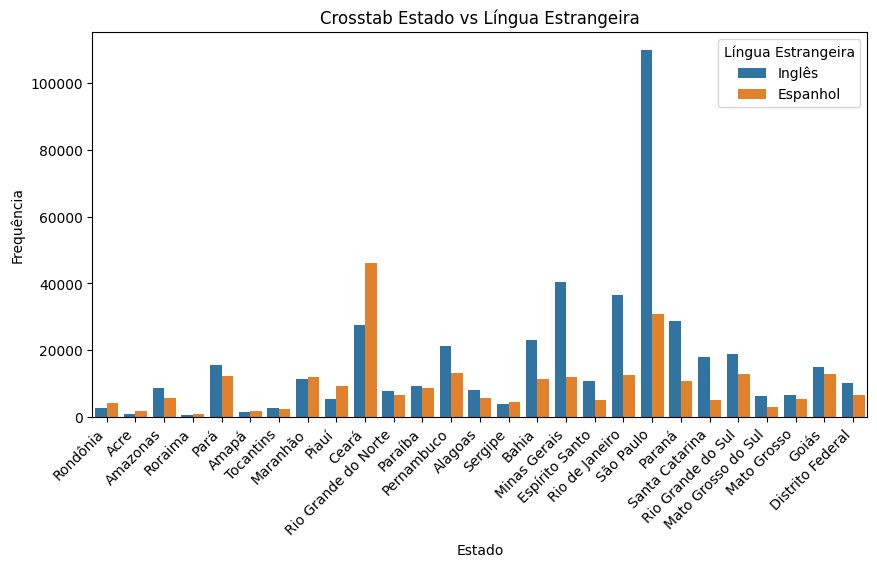

In [25]:
# Dicionários para mapeamento
uf_map = {
    12: 'Acre', 27: 'Alagoas', 16: 'Amapá', 13: 'Amazonas', 29: 'Bahia', 23: 'Ceará',
    53: 'Distrito Federal', 32: 'Espírito Santo', 52: 'Goiás', 21: 'Maranhão',
    51: 'Mato Grosso', 50: 'Mato Grosso do Sul', 31: 'Minas Gerais', 15: 'Pará',
    25: 'Paraíba', 41: 'Paraná', 26: 'Pernambuco', 22: 'Piauí', 24: 'Rio Grande do Norte',
    43: 'Rio Grande do Sul', 33: 'Rio de Janeiro', 11: 'Rondônia', 14: 'Roraima',
    42: 'Santa Catarina', 35: 'São Paulo', 28: 'Sergipe', 17: 'Tocantins'
}
lingua_map = {0: 'Inglês', 1: 'Espanhol'}

# Função para ajustar categorias dinamicamente
def ajustar_categorias(coluna, mapa):
    return coluna.cat.rename_categories(mapa)

# Ajustar categorias e plotar
plt.figure(figsize=(10, 5))
x_data = ajustar_categorias(df_enem['CAT_CO_UF_ESC'], uf_map)
hue_data = ajustar_categorias(df_enem['CAT_LINGUA'], lingua_map)

sns.countplot(x=x_data, hue=hue_data)
plt.xticks(rotation=45, ha='right')
plt.title('Crosstab Estado vs Língua Estrangeira')
plt.xlabel('Estado')
plt.ylabel('Frequência')
plt.legend(title='Língua Estrangeira')
plt.show()

CAT_CO_UF_ESC    11    12    13   14     15    16    17     21    22     23  \
CAT_COR_RACA                                                                  
0                71    52   215   23    361    40    45    158   170   1781   
1              2401   773  3309  474   7403   959  1430   5461  3844  18897   
2               632   282   722  122   3130   412   654   3008  1807   5450   
3              3695  1671  9635  874  16269  1975  2685  14373  8320  46481   
4               132    81   217    8    449    36   102    258   271    740   
5                43    34   392   82    156    14    38    107    78    400   

CAT_CO_UF_ESC  ...    32     33     35     41     42     43    50    51  \
CAT_COR_RACA   ...                                                        
0              ...   115    479   1030    410    207    288    87   118   
1              ...  7525  27020  92072  28300  18972  26407  5027  5090   
2              ...  1913   6714  11078   1485    716   1421   495  

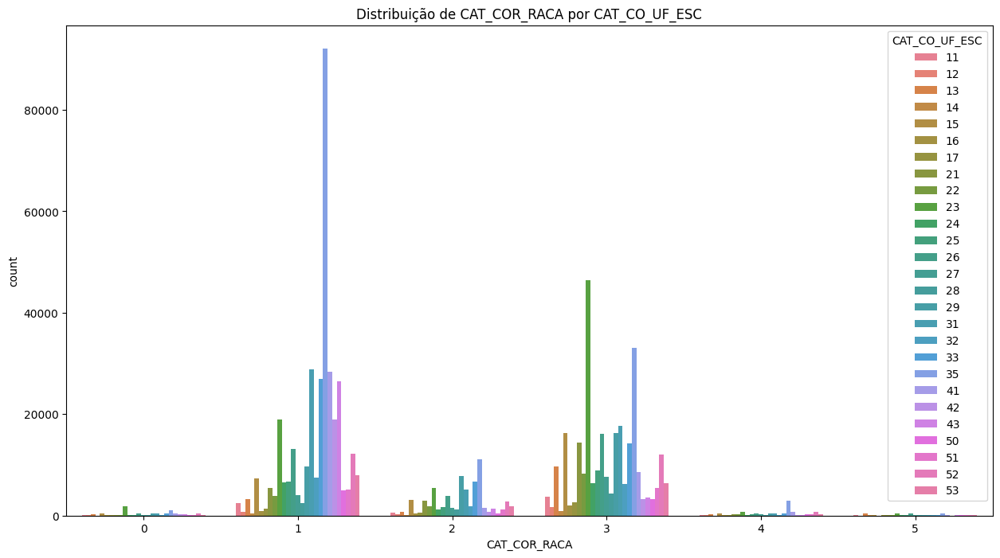

CAT_ESTADO_CIVIL      0       1     2     3   4
CAT_COR_RACA                                   
0                  1211    6686    60    47   1
1                 11280  331887  1469  2339  68
2                  2444   64652   519   667  28
3                 10118  265438  1950  1932  88
4                   584    9632    71    92   1
5                   183    3049    41    31   2


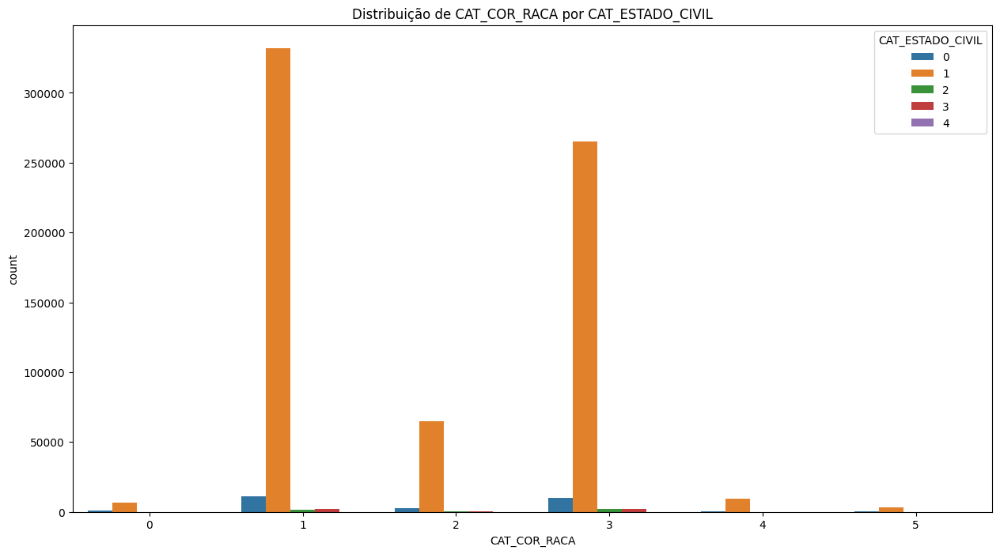

CAT_FAIXA_ETARIA     1       2       3      4     5     6    7    8    9   10  \
CAT_COR_RACA                                                                    
0                   56    2972    3963    630   185    50   22   21    9    8   
1                 2802  151116  169956  17454  3223   772  293  171  114   77   
2                  407   22770   34870   6761  1706   543  215  140   87   60   
3                 2189  103087  141636  21398  5077  1599  688  406  268  231   
4                   95    4249    4973    717   165    63   18   15   15    7   
5                   24    1071    1650    319   110    34   16   13    7    3   

CAT_FAIXA_ETARIA   11   12   13   14   15   16  17  18  19  20  
CAT_COR_RACA                                                    
0                  23   18   16   14    5   10   2   1   0   0  
1                 273  173  153  139  129  103  46  26  16   7  
2                 210  138  132   82   71   48  48  11   9   2  
3                 860  578

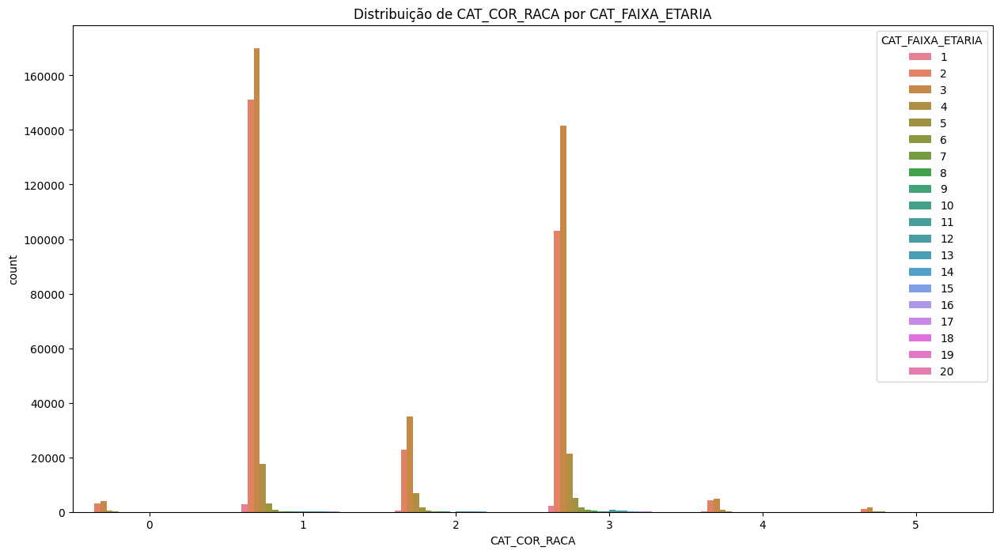

CAT_LINGUA         0       1
CAT_COR_RACA                
0               4685    3320
1             250701   96342
2              38410   29900
3             149325  130201
4               6600    3780
5               1417    1889


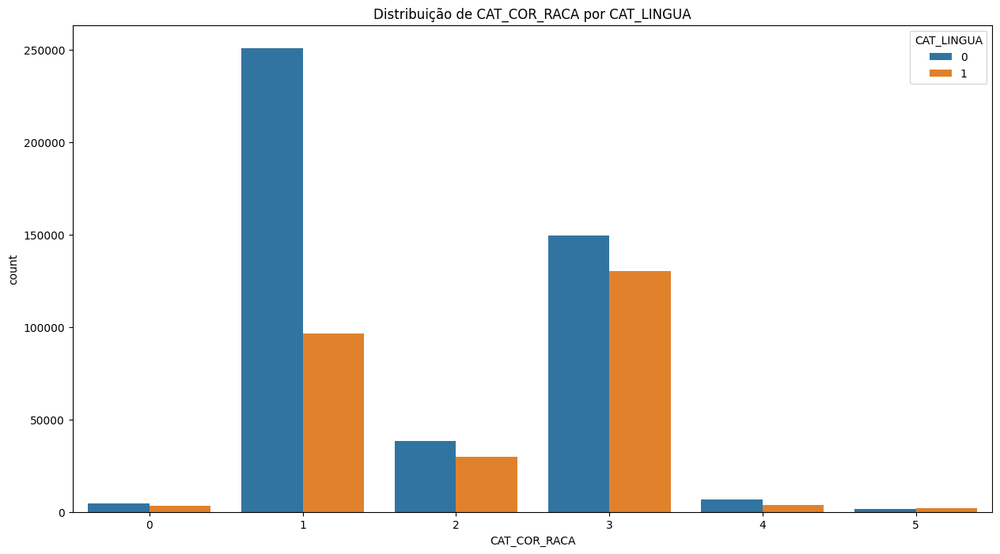

CAT_Q003          A      B      C       D      E      F
CAT_COR_RACA                                           
0              1222   1354   1506    1556    688   1679
1             30528  49679  74280  102828  55503  34225
2              9369  15799  18495   11195   2679  10773
3             54661  56235  66589   50314  13753  37974
4              1486   1678   2006    2513   1334   1363
5               964    643    619     465    119    496


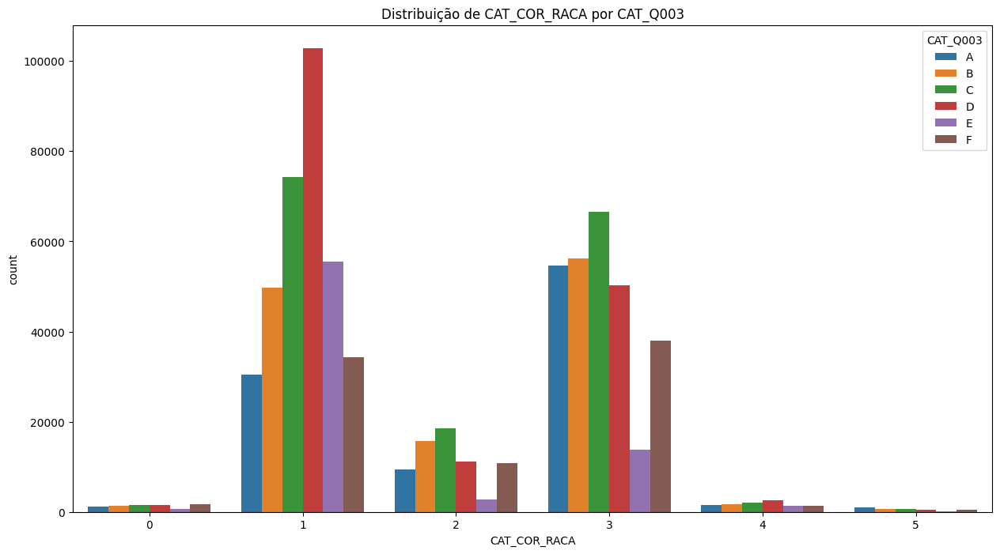

CAT_Q004          A       B      C       D      E      F
CAT_COR_RACA                                            
0              1013    2615    508    1887    512   1470
1             20775  109229  21525  123972  41946  29596
2              7524   31767   5012   15394   2093   6520
3             45889  112186  18807   64049  10144  28451
4              1137    3504    731    2879   1017   1112
5               865    1168    195     638     76    364


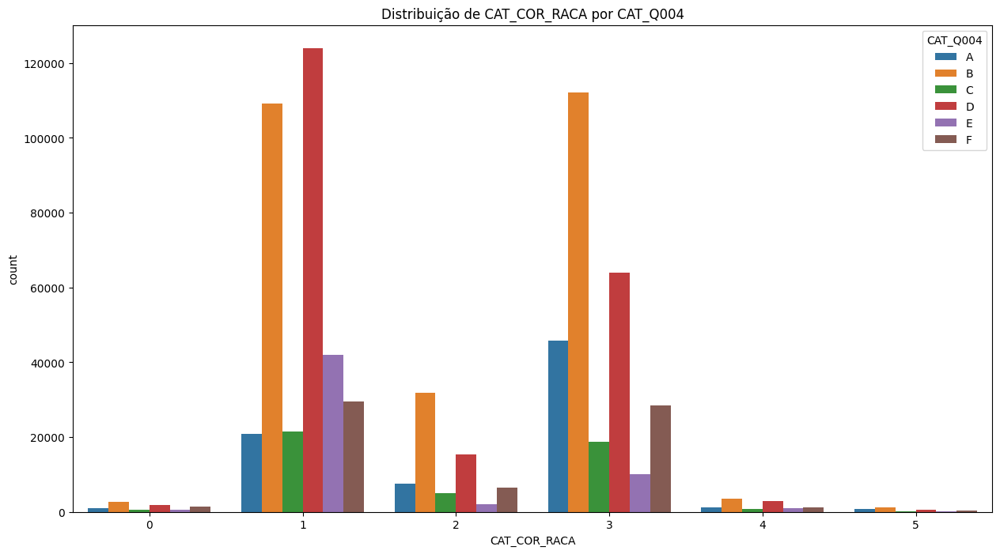

CAT_SEXO           F       M
CAT_COR_RACA                
0               4356    3649
1             193866  153177
2              36358   31952
3             154927  124599
4               5968    4412
5               1790    1516


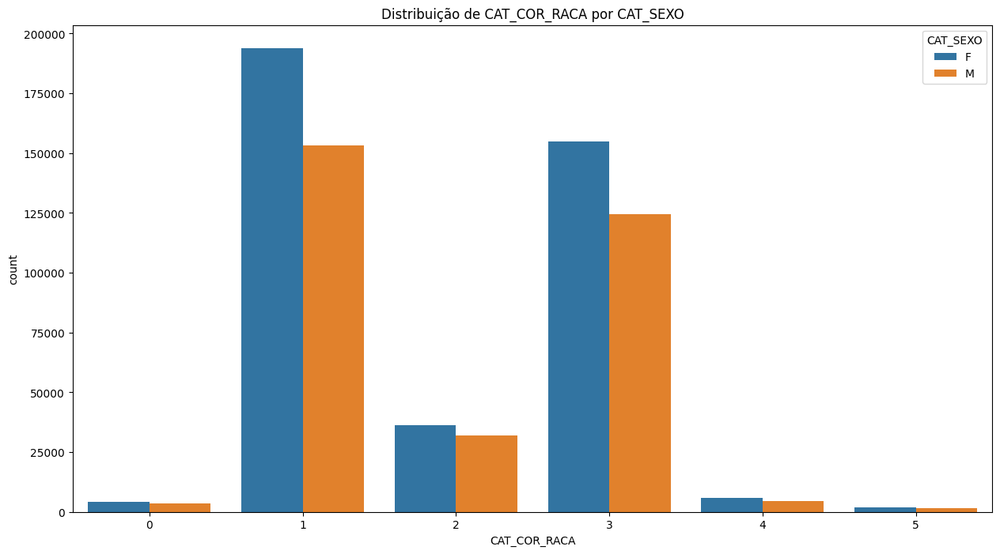

CAT_ESTADO_CIVIL     0       1    2     3   4
CAT_CO_UF_ESC                                
11                 352    6484   84    50   4
12                 174    2669   22    28   0
13                 548   13719   87   131   5
14                  67    1489    3    24   0
15                1237   26172  182   170   7
16                 180    3224   19    13   0
17                 188    4694   23    46   3
21                1153   21932  120   158   2
22                 795   13458  142    90   5
23                3124   69741  443   407  34
24                 474   13684   88    97   4
25                 703   16927  176   108   7
26                1249   32784  184   215  10
27                 547   12926  226   126  13
28                 373    7951   31    57   2
29                1447   32885  194   236  10
31                1559   50306  273   409  10
32                 495   15280   94   116   1
33                1101   47261  282   362  10
35                4099  134862  59

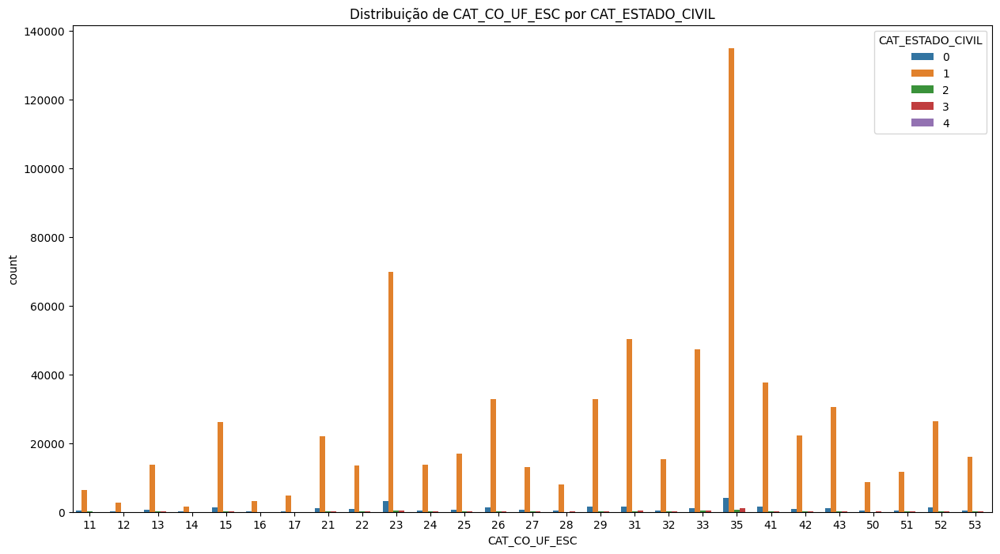

CAT_FAIXA_ETARIA    1      2      3     4     5    6    7    8   9  10   11  \
CAT_CO_UF_ESC                                                                 
11                 32   2039   4286   424    72   24   11    6   8   8   18   
12                 24   1090   1490   202    42   14    7    3   3   1    9   
13                118   5207   7653  1045   179   68   21   24  13   8   57   
14                 13    451   1001    96    14    3    2    1   1   0    1   
15                467   9677  12724  3005   913  284  140   75  54  41  126   
16                 38   1182   1592   442   101   25   17    6   4   4   12   
17                 96   2198   2242   293    60   16   14    3   6   3    7   
21                364   9446  10916  1885   414  134   43   27  13   6   34   
22                253   5103   6756  1473   424  130   56   32  24  17   65   
23                258  27864  37505  5166  1274  410  183  100  80  60  260   
24                170   4115   6778  2125   640  211

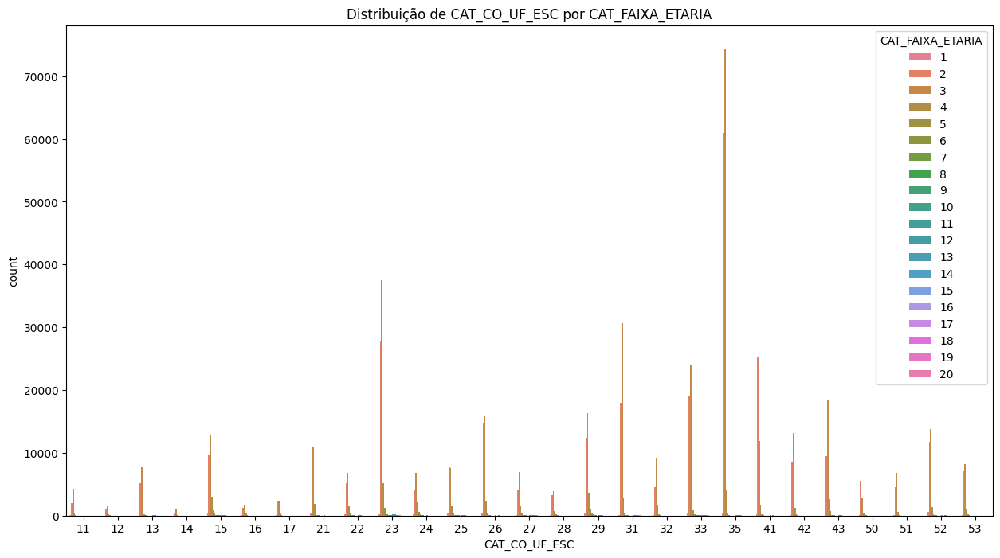

CAT_LINGUA          0      1
CAT_CO_UF_ESC               
11               2641   4333
12                933   1960
13               8720   5770
14                525   1058
15              15502  12266
16               1505   1931
17               2624   2330
21              11296  12069
22               5291   9199
23              27518  46231
24               7705   6642
25               9236   8685
26              21174  13268
27               8003   5835
28               3790   4624
29              23212  11560
31              40515  12042
32              10787   5199
33              36410  12606
35             109682  30921
41              28713  10901
42              18137   5205
43              18992  12869
50               6293   2887
51               6669   5504
52              15126  12973
53              10139   6564


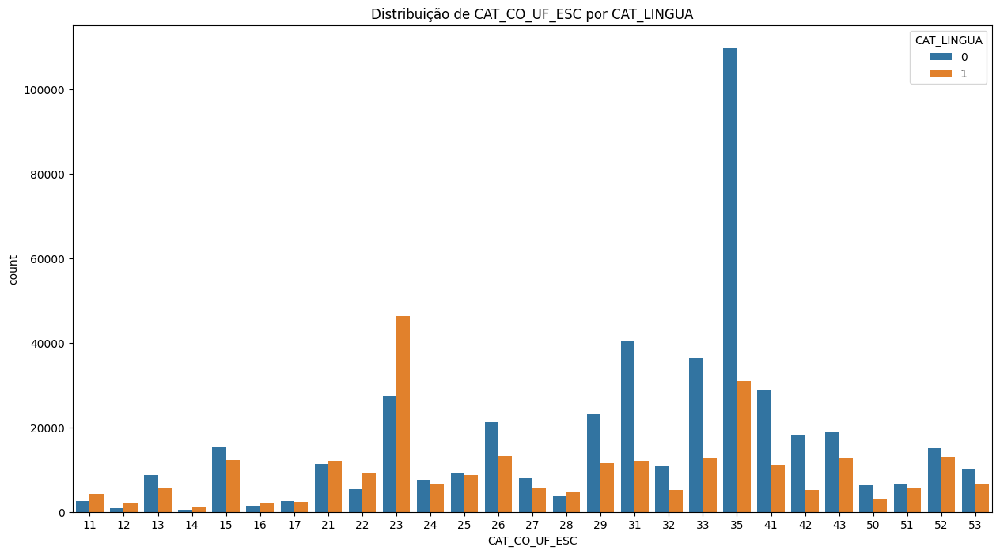

CAT_Q003           A      B      C      D      E      F
CAT_CO_UF_ESC                                          
11              1359   1227   1417   1543    488    940
12               476    647    469    646    192    463
13              2060   2867   3006   2997   1058   2502
14               138    275    293    447    187    243
15              5087   5777   5562   5658   1769   3915
16               346    829    613    830    308    510
17              1082    768    949   1085    474    596
21              7613   4223   4056   3794   1065   2614
22              4221   2819   2296   2631    902   1621
23             23243  15680  12008   7966   2547  12305
24              2501   2778   2876   3469   1177   1546
25              4964   3618   3145   3092   1197   1905
26              6595   7012   7047   6723   2737   4328
27              3089   2811   2750   2352    888   1948
28              1980   1543   1710   1613    579    989
29              6123   6151   7391   8201   3039

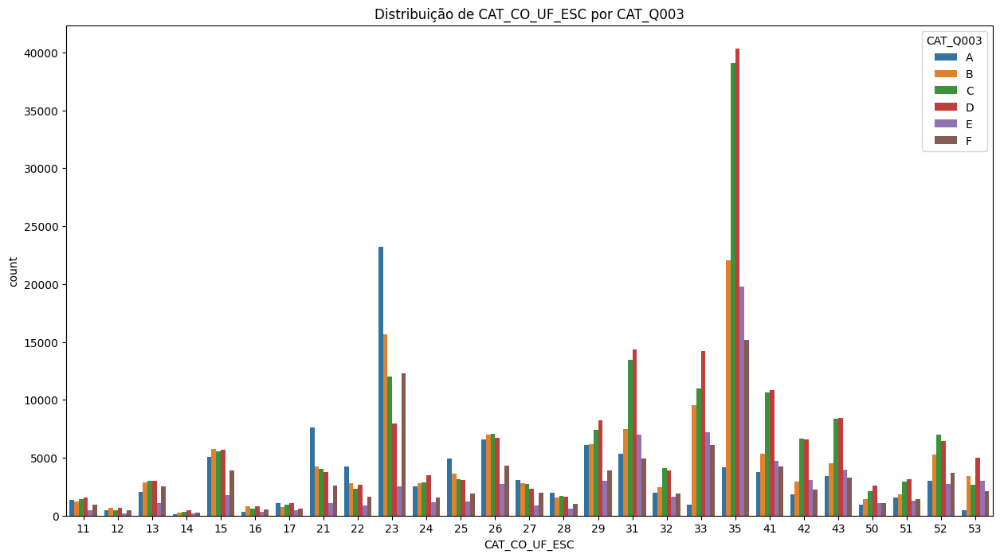

CAT_Q004           A      B      C      D      E      F
CAT_CO_UF_ESC                                          
11               904   2631    423   1842    421    753
12               282   1218    110    810    169    304
13              1824   5484   1112   3536    822   1712
14                70    546     78    596    140    153
15              4006  11276   1329   7072   1378   2707
16               261   1448    145   1043    225    314
17               761   1662    186   1566    368    411
21              7166   7566    877   5315    842   1599
22              3879   4964    591   3313    640   1103
23             20914  25621   5160  10237   1956   9861
24              2316   5200    767   3848    946   1270
25              4783   6186    707   3895    871   1479
26              6154  12232   1815   8545   2214   3482
27              2707   5237    569   3068    701   1556
28              1802   2967    359   2038    420    828
29              4879  12530   1749  10307   2435

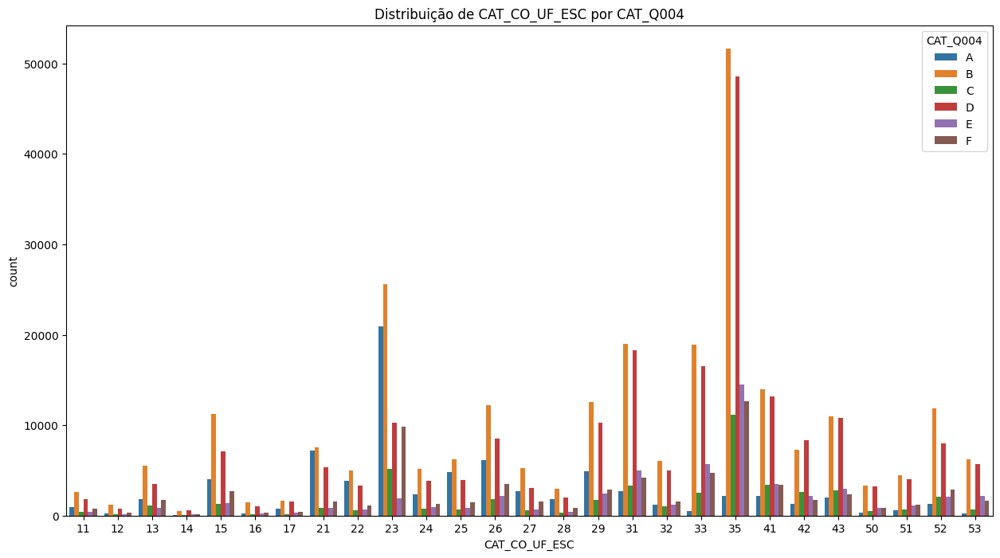

CAT_SEXO           F      M
CAT_CO_UF_ESC              
11              4018   2956
12              1595   1298
13              7964   6526
14               937    646
15             15475  12293
16              1797   1639
17              2787   2167
21             13275  10090
22              7981   6509
23             38836  34913
24              7902   6445
25              9671   8250
26             18940  15502
27              7772   6066
28              4665   3749
29             19635  15137
31             29135  23422
32              8833   7153
33             27800  21216
35             78256  62347
41             21968  17646
42             13260  10082
43             18020  13841
50              5071   4109
51              6961   5212
52             15357  12742
53              9354   7349


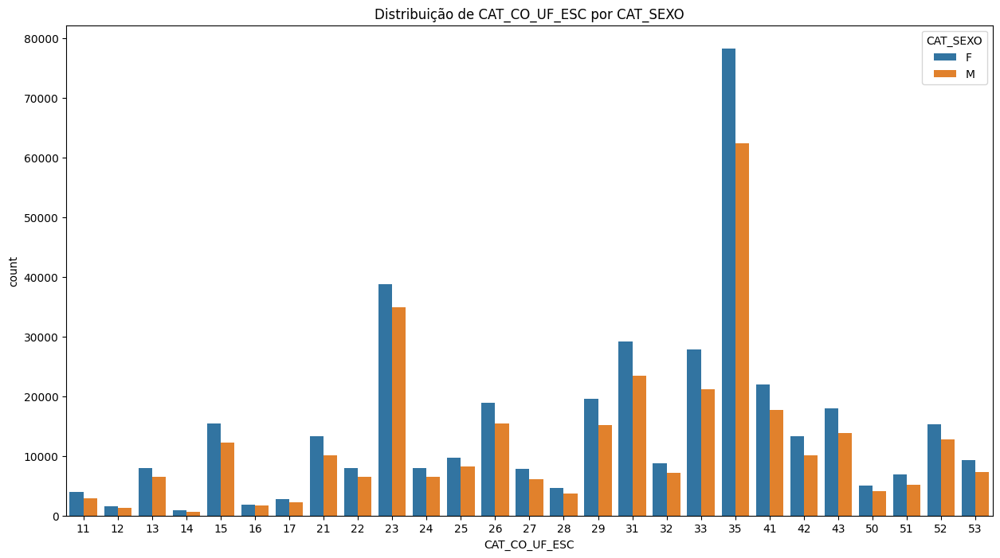

CAT_FAIXA_ETARIA     1       2       3      4     5     6     7    8    9  \
CAT_ESTADO_CIVIL                                                            
0                  207   10634   12169   1642   378   137    59   52   33   
1                 5327  271827  341160  45057  9944  2863  1153  666  436   
2                   10     904    1277    250    88    47    27   40   24   
3                   28    1858    2387    323    55    14    13    7    6   
4                    1      42      55      7     1     0     0    1    1   

CAT_FAIXA_ETARIA   10    11   12   13   14   15   16  17  18  19  20  
CAT_ESTADO_CIVIL                                                      
0                  23   151   98  105   53   25   28  15   7   4   0  
1                 320  1017  557  413  235  161  119  58  22   7   2  
2                  35   191  218  289  235  202  140  77  29  21   6  
3                   8    49   60   67   50   67   58  32  16   7   3  
4                   0     4    1  

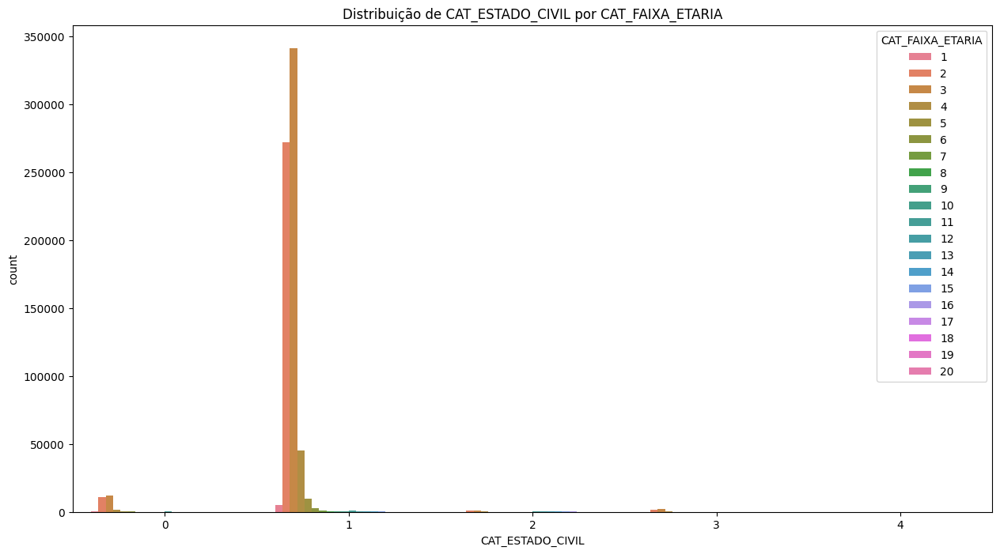

CAT_LINGUA             0       1
CAT_ESTADO_CIVIL                
0                  15758   10062
1                 430047  251297
2                   2051    2059
3                   3201    1907
4                     81     107


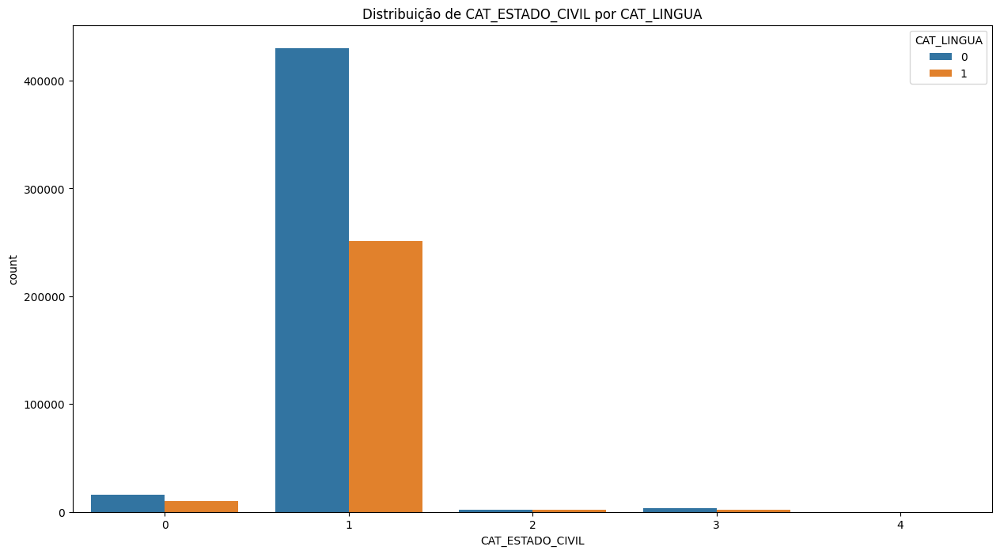

CAT_Q003              A       B       C       D      E      F
CAT_ESTADO_CIVIL                                             
0                  3836    4311    5451    5101   2452   4669
1                 92430  119420  155983  162131  70793  80587
2                  1272     655     816     588    284    495
3                   631     971    1210    1028    536    732
4                    61      31      35      23     11     27


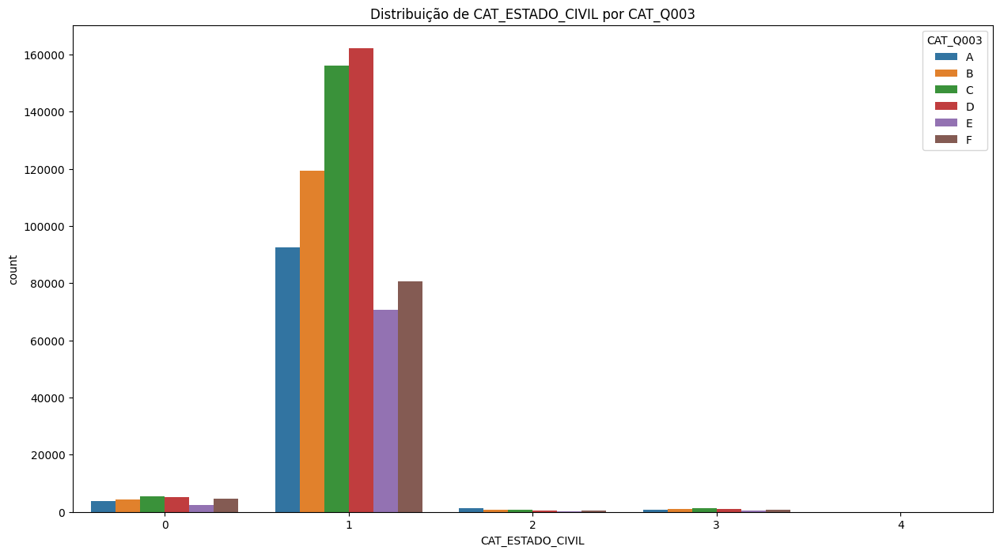

CAT_Q004              A       B      C       D      E      F
CAT_ESTADO_CIVIL                                            
0                  2991    9168   1763    6403   1785   3710
1                 72572  247779  44375  200435  53408  62775
2                  1114    1429    246     673    219    429
3                   481    2027    384    1281    363    572
4                    45      66     10      27     13     27


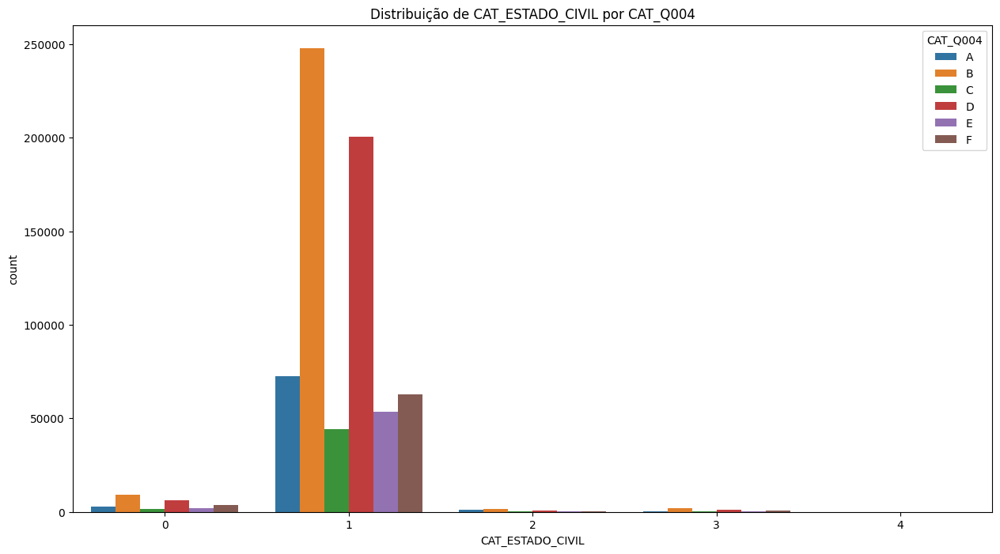

CAT_SEXO               F       M
CAT_ESTADO_CIVIL                
0                  13092   12728
1                 379838  301506
2                   2178    1932
3                   2048    3060
4                    109      79


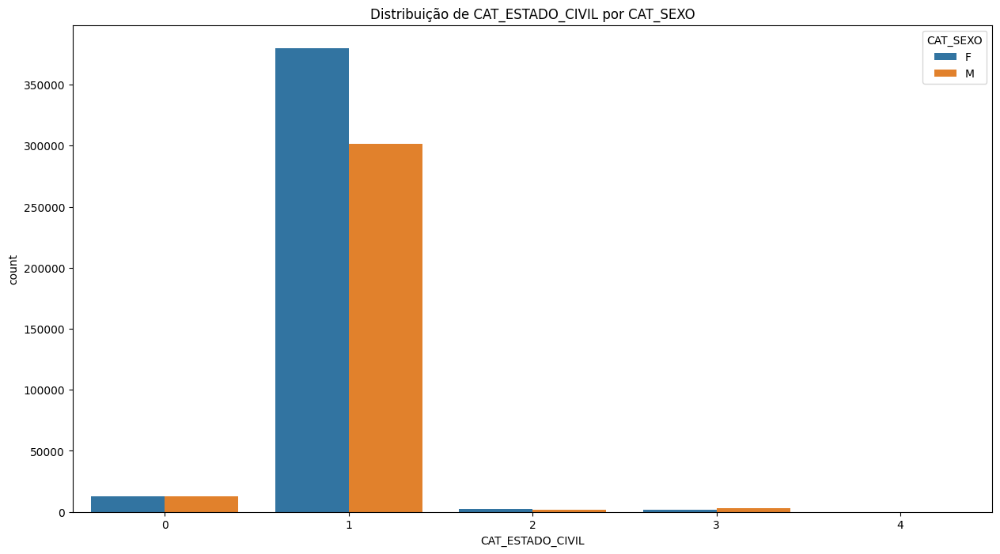

CAT_LINGUA             0       1
CAT_FAIXA_ETARIA                
1                   4079    1494
2                 190777   94488
3                 221711  135337
4                  25285   21994
5                   5105    5361
6                   1348    1713
7                    494     758
8                    326     440
9                    198     302
10                   139     247
11                   487     925
12                   300     634
13                   279     605
14                   207     378
15                   170     298
16                   124     234
17                    66     129
18                    26      55
19                    13      29
20                     4      11


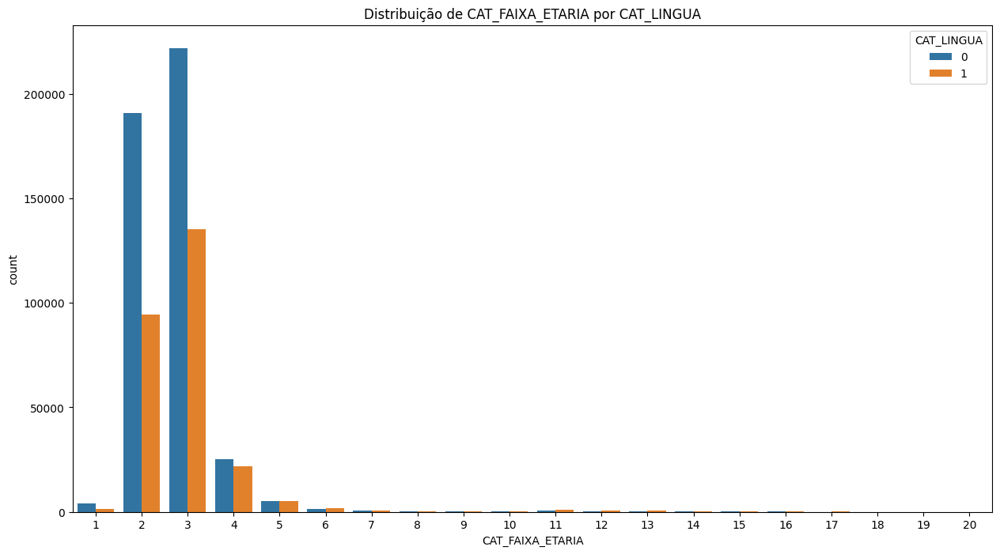

CAT_Q003              A      B      C      D      E      F
CAT_FAIXA_ETARIA                                          
1                   619    708    795   1634   1372    445
2                 32087  45785  61793  78174  37187  30239
3                 51054  64597  85588  79234  32561  44014
4                  8153   9798  11097   7787   2466   7978
5                  2306   2250   2236   1372    379   1923
6                   882    684    601    297     49    548
7                   412    250    241     76     15    258
8                   266    164    142     52      8    134
9                   159    105    111     26      3     96
10                  137     84     72     22      2     69
11                  574    279    232     66      9    252
12                  403    186    162     27      3    153
13                  416    161    123     26      6    152
14                  262    118     90     19      6     90
15                  197     89     79     18      6     

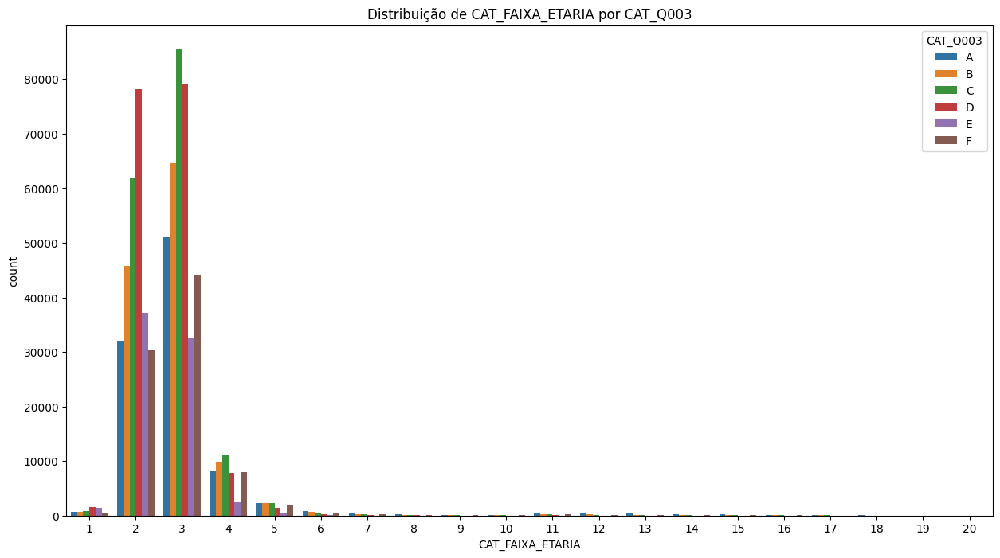

CAT_Q004              A       B      C      D      E      F
CAT_FAIXA_ETARIA                                           
1                   431    1273    227   2177   1099    366
2                 23788   93877  17648  96665  28320  24967
3                 40337  135805  24392  97979  24302  34233
4                  6895   20328   3287   9552   1748   5469
5                  2041    4597    673   1671    229   1255
6                   829    1287    185    347     42    371
7                   390     535     52    105     15    155
8                   246     342     38     60      7     73
9                   158     210     25     39      4     64
10                  127     169     23     20      8     39
11                  529     609     69     73      5    127
12                  376     382     38     37      1    100
13                  373     355     37     26      3     90
14                  250     221     31     20      1     62
15                  178     186     19  

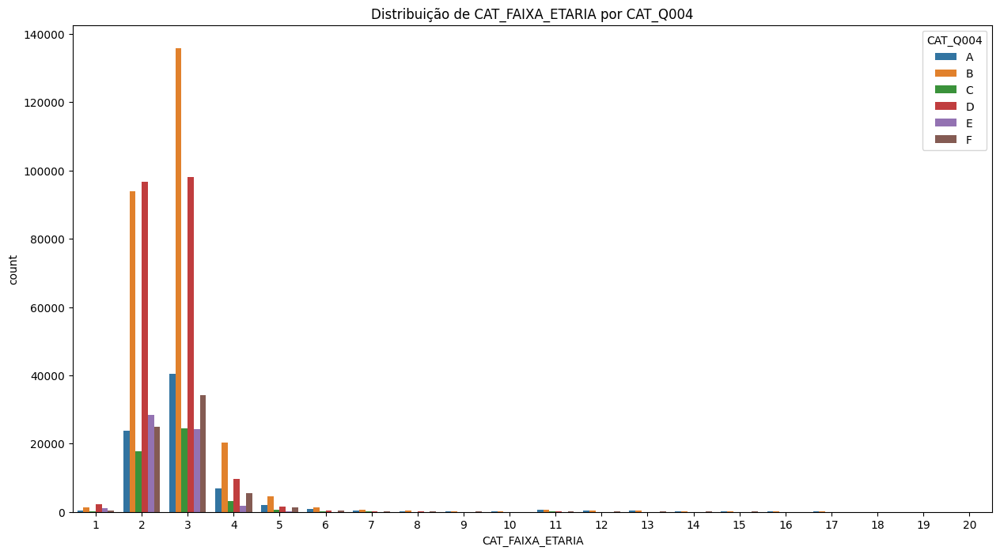

CAT_SEXO               F       M
CAT_FAIXA_ETARIA                
1                   3511    2062
2                 162062  123203
3                 197622  159426
4                  22825   24454
5                   4708    5758
6                   1394    1667
7                    625     627
8                    427     339
9                    278     222
10                   245     141
11                   963     449
12                   685     249
13                   665     219
14                   442     143
15                   331     137
16                   264      94
17                   135      60
18                    52      29
19                    23      19
20                     8       7


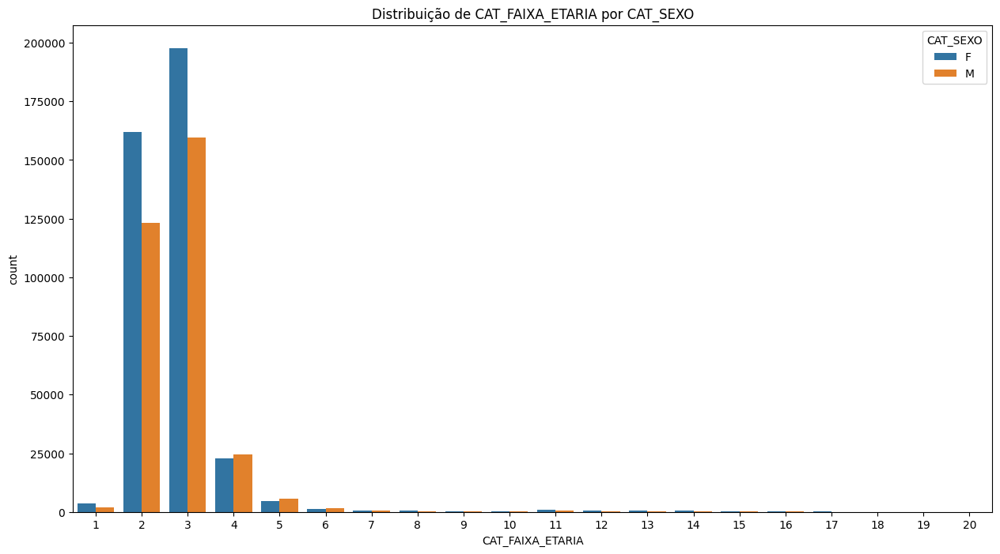

CAT_Q003        A      B       C       D      E      F
CAT_LINGUA                                            
0           38754  72018  101342  125995  63945  49084
1           59476  53370   62153   42876  10131  37426


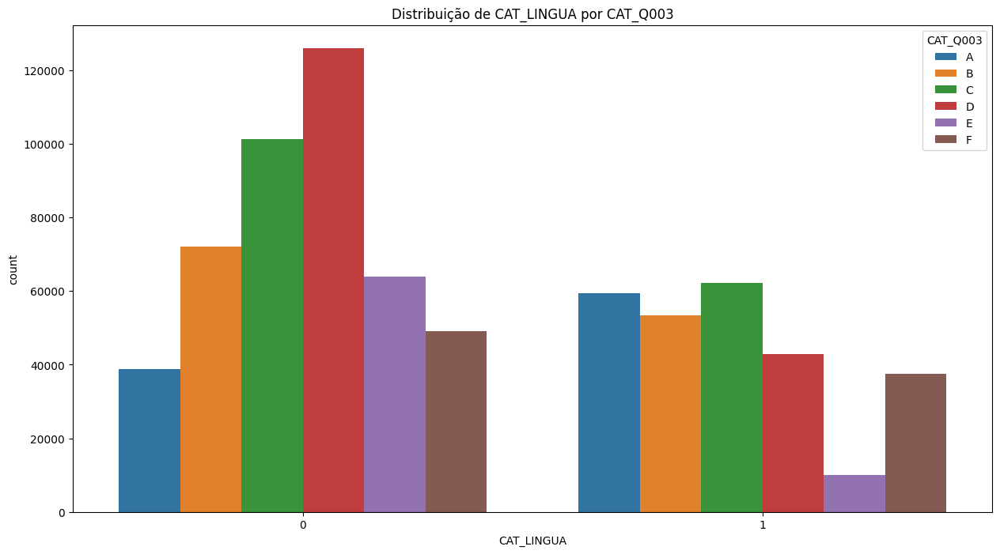

CAT_Q004        A       B      C       D      E      F
CAT_LINGUA                                            
0           28394  153312  28960  152156  48099  40217
1           48809  107157  17818   56663   7689  27296


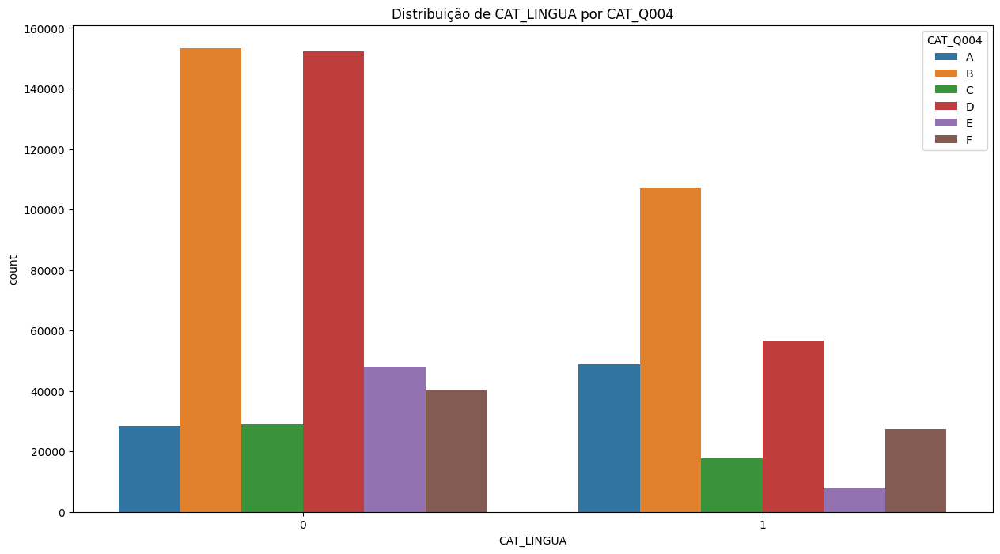

CAT_SEXO         F       M
CAT_LINGUA                
0           234433  216705
1           162832  102600


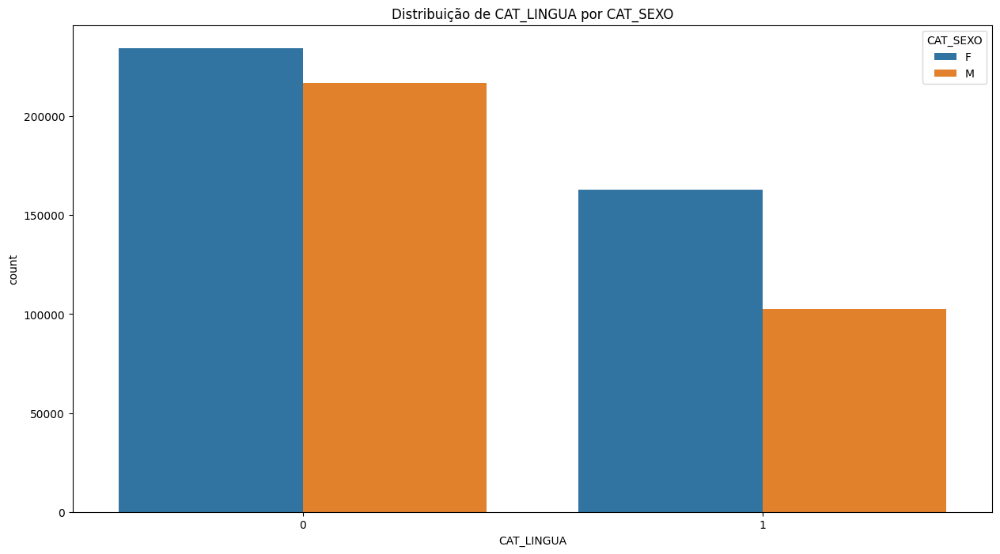

CAT_Q004      A      B      C      D      E      F
CAT_Q003                                          
A         59530  21824   2428   9716    965   3767
B          5451  80807   7443  21731   2422   7534
C          5447  78993  23590  38594   3648  13223
D          2359  38821   6722  96748  13089  11132
E           450   8069   1575  26273  32654   5055
F          3966  31955   5020  15757   3010  26802


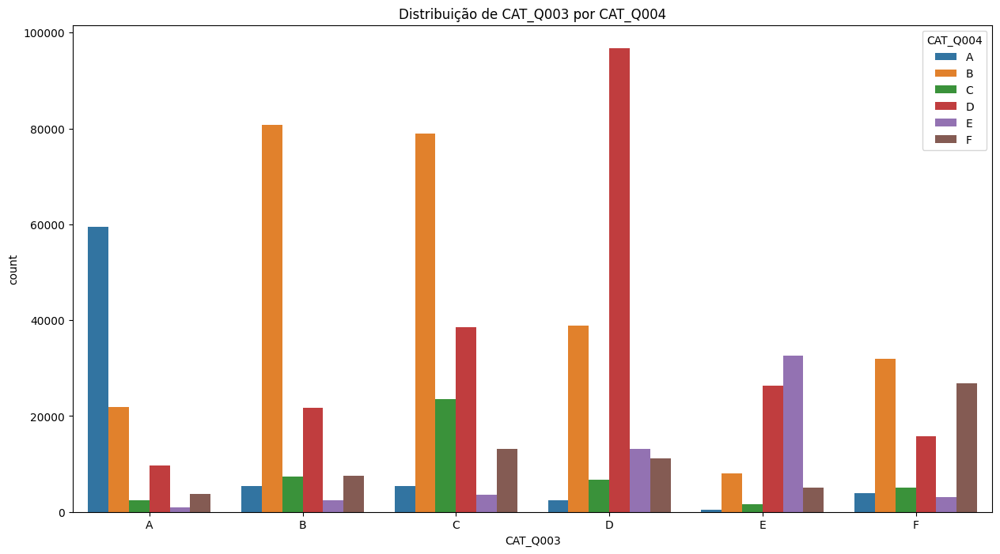

CAT_SEXO      F      M
CAT_Q003              
A         57831  40399
B         71175  54213
C         92042  71453
D         91049  77822
E         36775  37301
F         48393  38117


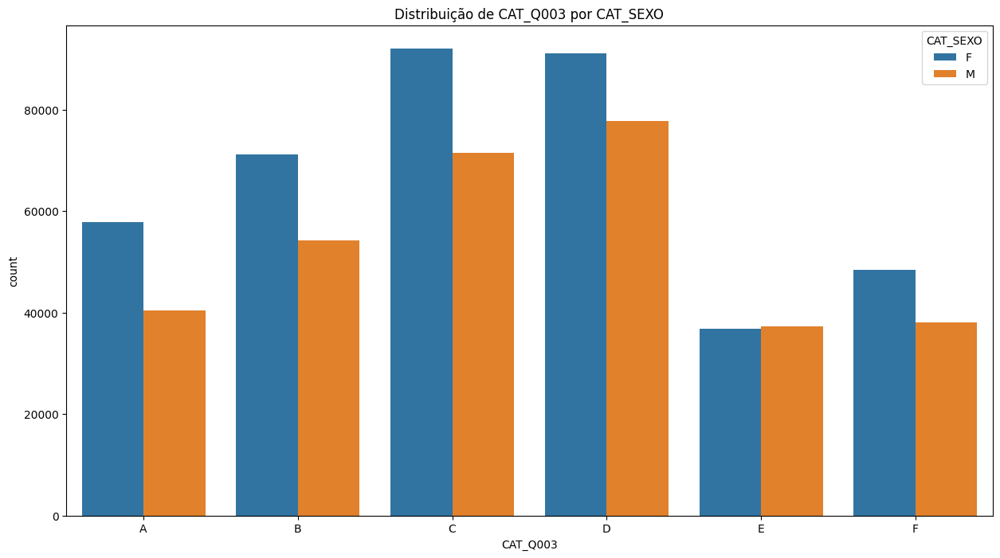

CAT_SEXO       F       M
CAT_Q004                
A          45505   31698
B         151288  109181
C          25832   20946
D         113317   95502
E          27869   27919
F          33454   34059


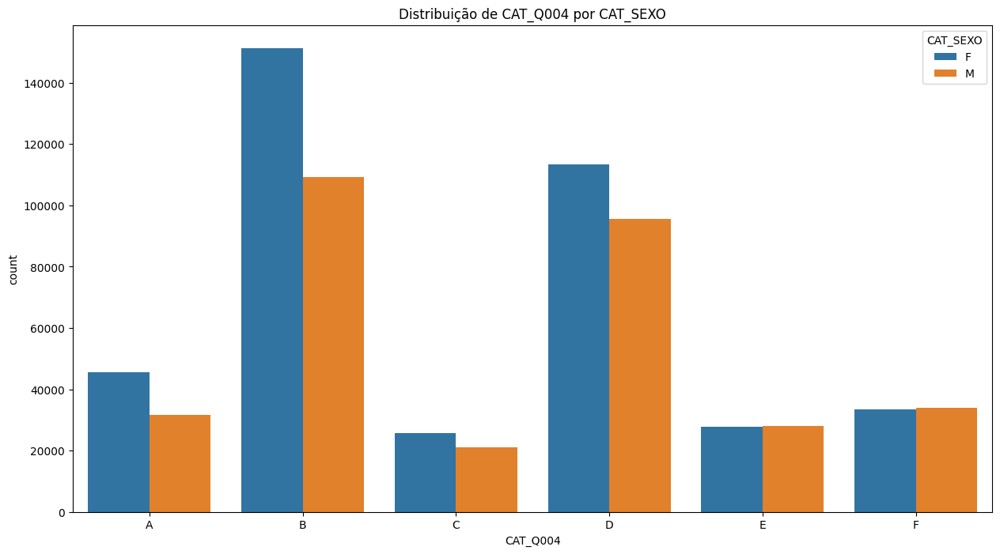

In [26]:
# crosstab para variáveis categóricas
lista_analise = ['CAT_COR_RACA', 'CAT_CO_UF_ESC', 'CAT_ESTADO_CIVIL', 'CAT_FAIXA_ETARIA', 'CAT_LINGUA','CAT_Q003', 'CAT_Q004', 'CAT_SEXO']

combinacao_analisada = []

for col in df_enem_cat[lista_analise]:
    for col2 in df_enem_cat[lista_analise]:
        if col != col2 and (col, col2) not in combinacao_analisada and (col2, col) not in combinacao_analisada:
            combinacao_analisada.append((col, col2))
            
            plt.figure(figsize=(15, 8))
            print(pd.crosstab(df_enem[col], df_enem[col2]))
            sns.countplot(data=df_enem, x=col, hue=col2)
            plt.title(f'Distribuição de {col} por {col2}')
            plt.show()

    Identificar variáveis com muitas categorias

In [27]:
# análise quantidade de categorias unicas por coluna
for col in df_enem_cat.columns.to_list():
    print(f'{col}: {df_enem[col].nunique()} categorias')
    print(df_enem[col].value_counts().head(10))
    print('\n')

CAT_COR_RACA: 6 categorias
CAT_COR_RACA
1    347043
3    279526
2     68310
4     10380
0      8005
5      3306
Name: count, dtype: int64


CAT_CO_MUNICIPIO_ESC: 5479 categorias
CAT_CO_MUNICIPIO_ESC
3550308    35240
3304557    20557
2304400    19875
5300108    16703
1302603     9434
4106902     9146
3106200     8763
2611606     8296
2927408     8157
5208707     8001
Name: count, dtype: int64


CAT_CO_UF_ESC: 27 categorias
CAT_CO_UF_ESC
35    140603
23     73749
31     52557
33     49016
41     39614
29     34772
26     34442
43     31861
52     28099
15     27768
Name: count, dtype: int64


CAT_DEPENDENCIA_ADM_ESC: 4 categorias
CAT_DEPENDENCIA_ADM_ESC
2    452851
4    214138
1     43797
3      5784
Name: count, dtype: int64


CAT_ENSINO: 3 categorias
CAT_ENSINO
1    701708
0     12528
2      2334
Name: count, dtype: int64


CAT_ESCOLA: 2 categorias
CAT_ESCOLA
2    522848
3    193722
1         0
Name: count, dtype: int64


CAT_ESTADO_CIVIL: 5 categorias
CAT_ESTADO_CIVIL
1    681344
0   